In [1]:
!ls

11_mice_model
14_mice_checkpoints
EXPLORATION_try_archetypes_analysis.ipynb
analyze_nathan_readout_pca.ipynb
analyze_nathan_readout_pca_normalizing_embeddings_first.ipynb
clean_code_to_filter_embeddings-Copy1.ipynb
clean_code_to_filter_embeddings.ipynb
clean_code_to_filter_embeddings_normalized-Copy1.ipynb
clean_code_to_filter_embeddings_normalized.ipynb
clustering_analysis_11_mice.ipynb
clustering_analysis_with_more_data.ipynb
debug_whitener.ipynb
distance_distribution.png
do_neigbours_analysis_on_l2_norm_embeddings.ipynb
hoyer_scores.ipynb
metric_adjustment_as_in_aristotelian_paper_and_synthetic_data_exploration.ipynb
model_weights0.pth
model_weights123.pth
model_weights42.pth
move_to_phobos
newer_models
permutation_results.pkl
sensorium_data
some_random_distance_analaysis.ipynb
some_rouch_analysis.ipynb
try_to_mimic_our_knn.ipynb


In [2]:
import torch
import numpy as np
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
from tqdm import tqdm

from sklearn.metrics import adjusted_rand_score
from itertools import combinations
import seaborn as sns
from scipy.stats import gaussian_kde
from scipy.spatial.distance import cdist
from sklearn.manifold import TSNE
import os
from scanpy.tl import leiden

from sklearn.cluster import KMeans
from itertools import combinations

/Users/polinaturishcheva/anaconda3/envs/sinz_2018/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/polinaturishcheva/anaconda3/envs/sinz_2018/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/Users/polinaturishcheva/anaconda3/envs/sinz_2018/lib/python3.10/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [3]:
def whiten_readouts(cov_ema, readouts, eps=1e-5):
    eye = torch.eye(cov_ema.shape[0], dtype=cov_ema.dtype, device='cpu')
    L = torch.linalg.cholesky(cov_ema + eps * eye)

    whitened_readouts = L.T @ readouts.T
    return whitened_readouts.T

In [4]:
!ls 11_mice_model

11mice_seed17.pth 11mice_seed37.pth 11mice_seed59.pth
11mice_seed23.pth 11mice_seed43.pth 11mice_seed73.pth


In [5]:
example = torch.load(
    '11_mice_model/11mice_seed17.pth',
      map_location=torch.device('cpu'))

animals = list(set(
    [i.split('.')[1] for i in list(example.keys()) if 'readout' in i]
))

animals

['23656-14-22',
 '27204-5-13',
 '22846-10-16',
 '22620-4-15',
 '23964-4-22',
 '22223-2-15',
 '22564-2-12',
 '21067-10-18',
 '23343-5-17',
 '23555-5-12',
 '20457-5-9']

In [6]:
len(animals)

11

In [7]:
!ls 14_mice_checkpoints

fourier_seed0_14mice.pth   fourier_seed369_14mice.pth
fourier_seed123_14mice.pth fourier_seed42_14mice.pth
fourier_seed246_14mice.pth


In [10]:
# seed_w.keys()

In [11]:
models = {}

for s in [17, 23, 37, 43, 59, 73]: # [0, 42, 123, 246, 369]:
    path = f'11_mice_model/11mice_seed{s}.pth'
    seed_w = torch.load(path, map_location=torch.device('cpu'))
    models[s] = {}
    for a in animals:
        models[s][a] = seed_w[f'readout.{a}._features'].squeeze().numpy()
    models[s]['mu_ema'] = seed_w['whitener.mu_ema'].numpy()
    models[s]['cov_ema'] = seed_w['whitener.cov_ema'].numpy()

In [12]:
whitened = []
for s in models.keys():
    rr = torch.from_numpy(
        np.vstack([models[s][a] for a in animals])
    )
    rr_w = whiten_readouts(torch.from_numpy(models[s]['cov_ema']), rr)
    whitened.append(rr_w.numpy())

In [13]:
len(whitened), whitened[0].shape

(6, (77709, 96))

### Clean data - only based on data

In [14]:
# !ls

In [15]:
# !pwd

In [16]:
# !ls /Users/polinaturishcheva/Desktop/nathan_stuff/sensorium_data/

In [17]:
# !ls move_to_phobos

In [18]:
path_dict = {}
path_link = {}
for a in animals:
    if a in ['23343-5-17',
             '22846-10-16',
             '26872-17-20',
             '21067-10-18',
             '23656-14-22',
             '23964-4-22',
             '27204-5-13']:
        path_dict[a] = '/Users/polinaturishcheva/Desktop/nathan_stuff/sensorium_data/'
        path_link[a] = '-GrayImageNet-'
    else:
        path_dict[a] = '/Users/polinaturishcheva/Desktop/nathan_stuff/move_to_phobos/'
        path_link[a] = '-'

In [19]:
path_link

{'23656-14-22': '-GrayImageNet-',
 '27204-5-13': '-GrayImageNet-',
 '22846-10-16': '-GrayImageNet-',
 '22620-4-15': '-',
 '23964-4-22': '-GrayImageNet-',
 '22223-2-15': '-',
 '22564-2-12': '-',
 '21067-10-18': '-GrayImageNet-',
 '23343-5-17': '-GrayImageNet-',
 '23555-5-12': '-',
 '20457-5-9': '-'}

In [20]:
# mice = os.listdir(data_path)
coords = {}
coords_list = []
for a in animals:
    load_coords = np.load(
        f'{path_dict[a]}static{a}{path_link[a]}94c6ff995dac583098847cfecd43e7b6/meta/neurons/cell_motor_coordinates.npy'
    )
    coords[a] = load_coords
    coords_list.append(load_coords)
    
coords_list_together = np.vstack(coords_list)

In [21]:
RADIUS = 4              # max lateral (x, y) drift allowed between adjacent z-planes
CORR_THRESHOLD = 0.8
mice_neuron_indexes = np.cumsum([0]+[len(i) for i in coords_list])

def corr(x, y):
    x = x - x.mean()
    y = y - y.mean()
    return np.dot(x, y) / np.sqrt(np.dot(x, x) * np.dot(y, y))

def load_responses(animal_id):
    path = f'{path_dict[animal_id]}static{animal_id}{path_link[animal_id]}94c6ff995dac583098847cfecd43e7b6/data/responses/'
    n = len(os.listdir(path))
    return np.vstack([np.load(f'{path}{j}.npy') for j in range(n)]).T  # (neurons, images)

correlations_distribution = []

def walk_z(planes, z_order, target_resp, responses, offset, prev_xy):
    """Follow one cell across populated z-planes in a single direction (nearest plane first).
    Stops at the first plane that breaks the chain (too far laterally, or correlation too low)."""
    copies = []
    for z in z_order:
        gidx, x, y = min(planes[z], key=lambda t: abs(t[1] - prev_xy[0]) + abs(t[2] - prev_xy[1]))
        if abs(x - prev_xy[0]) > RADIUS or abs(y - prev_xy[1]) > RADIUS:
            break
        c = corr(target_resp, responses[gidx - offset])
        correlations_distribution.append(c)
        if c <= CORR_THRESHOLD:
            break
        copies.append(gidx)
        prev_xy = (x, y)
    return copies

copy_dict = {}

for a in range(len(mice_neuron_indexes) - 1):
    lo, hi = mice_neuron_indexes[a], mice_neuron_indexes[a + 1]
    responses = load_responses(animals[a])

    # group this animal's neurons by z-plane: z -> [(global_idx, x, y), ...]
    planes = {}
    for g in range(lo, hi):
        x, y, z = coords_list_together[g]
        planes.setdefault(z, []).append((g, x, y))
    sorted_z = sorted(planes)

    for g in tqdm(range(lo, hi)):
        x, y, z = coords_list_together[g]
        target = responses[g - lo]
        up   = [zz for zz in sorted_z if zz > z]           # nearest-first upward
        down = [zz for zz in sorted_z if zz < z][::-1]     # nearest-first downward
        copies = (walk_z(planes, up,   target, responses, lo, (x, y)) +
                  walk_z(planes, down, target, responses, lo, (x, y)))
        if copies:
            copy_dict[g] = copies

# group copies into connected components (symmetric + transitive) via union-find
parent = {}

def find(x):
    parent.setdefault(x, x)
    while parent[x] != x:
        parent[x] = parent[parent[x]]
        x = parent[x]
    return x

def union(a, b):
    parent[find(a)] = find(b)

for neuron, copies in copy_dict.items():
    for c in copies:
        union(neuron, c)

groups = {}
for node in parent:
    groups.setdefault(find(node), set()).add(node)

unique_groups = list(groups.values())

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5335/5335 [00:02<00:00, 1841.95it/s]


In [22]:
xss = [list(i) for i in unique_groups ]

flat_list = [
    x
    for xs in xss
    for x in xs
]

len(unique_groups), len(flat_list), len(set(flat_list)), len(flat_list)/len(unique_groups)

(15889, 52876, 52876, 3.3278368682736486)

In [23]:
individual_neurons = sorted(list(set(list(range(len(coords_list_together)))).difference(set(flat_list))))

In [24]:
unique_embeddings = []
for wh_idx in range(6):
    unique_embeddings.append(
            np.vstack([
            whitened[wh_idx][individual_neurons], 
            np.stack([whitened[wh_idx][list(i)].mean(0) for i in unique_groups])
        ])
    )
for i in unique_embeddings:
    print(i.shape)

(40722, 96)
(40722, 96)
(40722, 96)
(40722, 96)
(40722, 96)
(40722, 96)


In [25]:
def knn_consistency(knn1, knn2, ks):
    N, k_max = knn1.shape
    #idcs = torch.randperm(N)
    #knn2 = knn2[idcs]
    
    assert ks[-1] <= k_max 
    ranking = np.full((N, N), N, dtype=np.int32)  # Shape (N, N)
    ranking[np.arange(N)[:, None], knn1] = np.arange(k_max)[None]
    overlaps = []

    for k in tqdm(ks):
        neighbours = knn2[:, :k]  # Shape (N, k)
        shared = ranking[np.arange(N)[:, None], neighbours] < k  # Shape (N, k)
        num_shared = shared.sum() / N
        
        overlap = num_shared / k
        overlaps.append(overlap)

    return np.array(overlaps)


# def get_curve(k_range, all_features):
#     knns = []
#     for features in tqdm(all_features):
#         nn = NearestNeighbors(n_neighbors=k_range[-1]).fit(features)
#         knn = nn.kneighbors(return_distance=False)
#         knns.append(knn)

#     #for leniency in leniency_range:
#     x_idcs, y_idcs = np.tril_indices(len(all_features), k=-1)
#     curve = np.zeros(len(k_range))
#     for x, y in zip(x_idcs, y_idcs):
#         curve += knn_consistency(knns[x], knns[y], ks=k_range) 
    
#     curve /= len(x_idcs)

#     return curve

def get_curve(k_range, all_features):
    knns = []
    for features in tqdm(all_features):
        nn = NearestNeighbors(n_neighbors=k_range[-1]).fit(features)
        knn = nn.kneighbors(return_distance=False)
        knns.append(knn)

    x_idcs, y_idcs = np.tril_indices(len(all_features), k=-1)

    curves = []
    for x, y in zip(x_idcs, y_idcs):
        curves.append(knn_consistency(knns[x], knns[y], ks=k_range))

    curves = np.asarray(curves)          # (num_pairs, len(k_range))
    curve_mean = curves.mean(axis=0)
    curve_std = curves.std(axis=0)

    return curve_mean, curve_std

In [26]:
k_range = np.unique(np.geomspace(1, 1500, num=130, dtype=int))

In [27]:
# 11-52 started
knn_curve, curve_std = get_curve(k_range, unique_embeddings)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 96/96 [00:16<00:00,  5.78it/s]


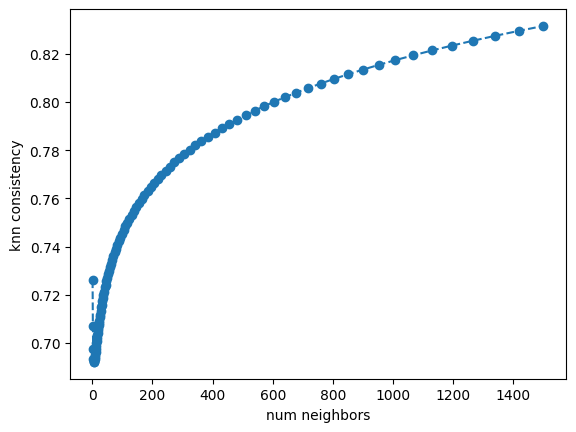

In [28]:
plt.plot(k_range, knn_curve, ls='--', marker='o')

plt.xlabel('num neighbors')
plt.ylabel('knn consistency')
plt.show()

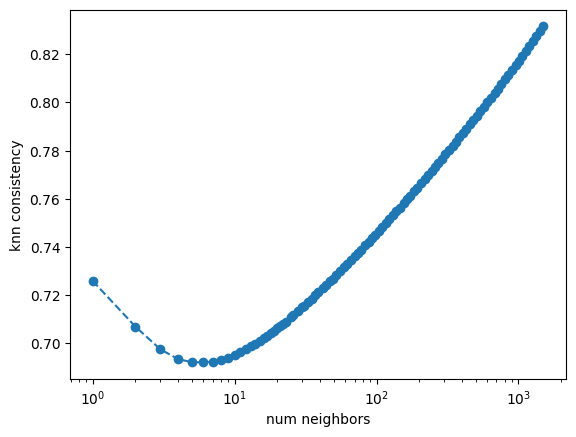

In [29]:
plt.plot(k_range, knn_curve, ls='--', marker='o')

plt.xlabel('num neighbors')
plt.ylabel('knn consistency')
plt.xscale('log')
plt.show()

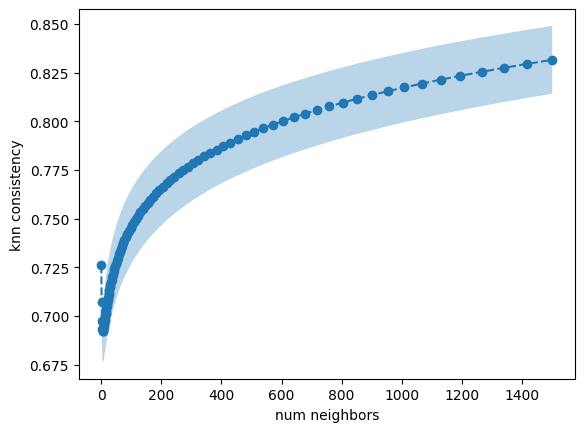

In [30]:
curve_mean = knn_curve

plt.plot(k_range, curve_mean, ls='--', marker='o')
plt.fill_between(
    k_range,
    curve_mean - curve_std,
    curve_mean + curve_std,
    alpha=0.3,
)

plt.xlabel("num neighbors")
plt.ylabel("knn consistency")
plt.show()

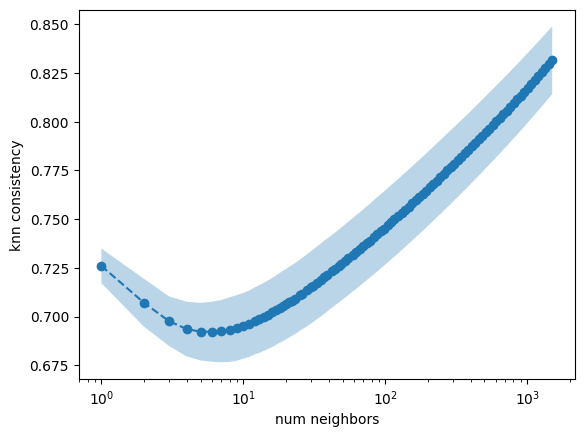

In [31]:
curve_mean = knn_curve

plt.plot(k_range, curve_mean, ls='--', marker='o')
plt.fill_between(
    k_range,
    curve_mean - curve_std,
    curve_mean + curve_std,
    alpha=0.3,
)

plt.xlabel("num neighbors")
plt.ylabel("knn consistency")
plt.xscale('log')
plt.show()

### Clustering and ARI

In [32]:
potential_clusters = np.unique(np.geomspace(2, 150, num=30, dtype=int))

In [34]:
len(unique_embeddings)

6

In [35]:
ari_mean = {}
ari_std = {}
for pc in tqdm(potential_clusters):
    bef_ari = []
    for uq_emb in unique_embeddings:
        km = KMeans(n_clusters=pc,
               init='k-means++', 
               n_init='auto', 
               max_iter=300,
               tol=0.0001, 
               verbose=0, 
               random_state=42).fit(uq_emb)
        bef_ari.append(km.labels_)
    scores = []    
    for i, j in list(combinations(range(6), 2)):
        scores.append(
            adjusted_rand_score(bef_ari[i], bef_ari[j])
        )
        
    ari_mean[pc] = np.mean(scores)
    ari_std[pc] = np.std(scores, ddof=1)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [03:15<00:00,  7.54s/it]


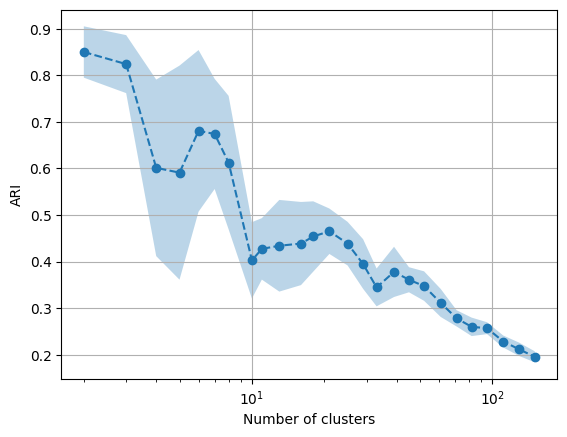

In [36]:
plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o')
plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
plt.xscale('log')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )

In [37]:
potential_clusters

array([  2,   3,   4,   5,   6,   7,   8,  10,  11,  13,  16,  18,  21,
        25,  29,  33,  39,  45,  52,  61,  71,  82,  95, 111, 129, 150])

In [38]:
ari_mean_2 = {}
ari_std_2 = {}
for pc in tqdm(potential_clusters):
    bef_ari = []
    uq_emb = unique_embeddings[0]
    for s in [17, 23, 37, 43, 59, 73]: #[0, 42, 123, 246, 369]:
        km = KMeans(n_clusters=pc,
               init='k-means++', 
               n_init='auto', 
               max_iter=300,
               tol=0.0001, 
               verbose=0, 
               random_state=s).fit(uq_emb)
        bef_ari.append(km.labels_)
    scores = []    
    for i, j in list(combinations(range(6), 2)):
        scores.append(
            adjusted_rand_score(bef_ari[i], bef_ari[j])
        )
        
    ari_mean_2[pc] = np.mean(scores)
    ari_std_2[pc] = np.std(scores, ddof=1)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [03:03<00:00,  7.04s/it]


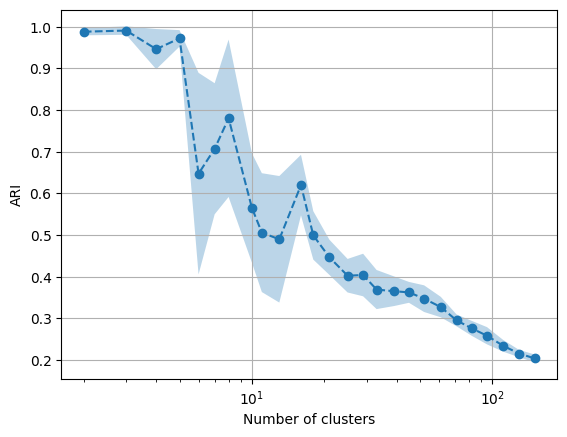

In [39]:
plt.plot(potential_clusters, list(ari_mean_2.values()), ls='--', marker='o')
plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
plt.xscale('log')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_2.values())) - np.asarray(list(ari_std_2.values())),
                 np.asarray(list(ari_mean_2.values())) + np.asarray(list(ari_std_2.values())),
                 alpha=0.3
                )

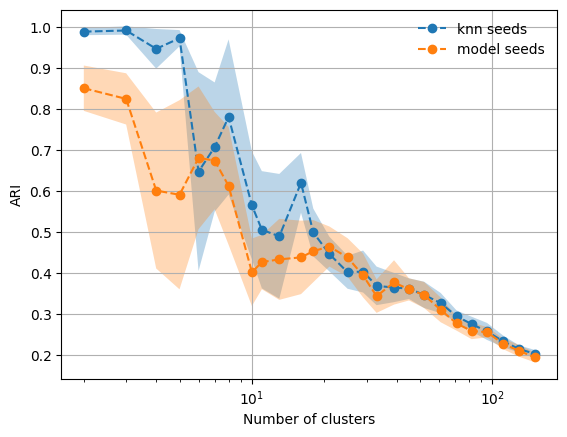

In [40]:
plt.plot(potential_clusters, list(ari_mean_2.values()), ls='--', marker='o', label='knn seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_2.values())) - np.asarray(list(ari_std_2.values())),
                 np.asarray(list(ari_mean_2.values())) + np.asarray(list(ari_std_2.values())),
                 alpha=0.3
                )


plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
plt.xscale('log')
plt.legend(frameon=False)

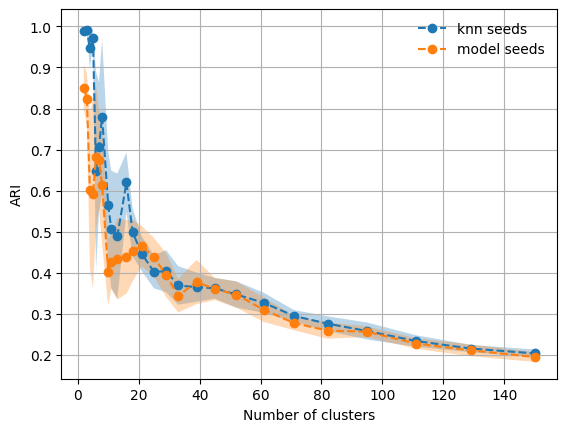

In [41]:
plt.plot(potential_clusters, list(ari_mean_2.values()), ls='--', marker='o', label='knn seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_2.values())) - np.asarray(list(ari_std_2.values())),
                 np.asarray(list(ari_mean_2.values())) + np.asarray(list(ari_std_2.values())),
                 alpha=0.3
                )


plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
# plt.xscale('log')
plt.legend(frameon=False)

### Now try same with spherical GMMs?

In [42]:
from sklearn.mixture import GaussianMixture

In [43]:
ari_mean_gmm = {}
ari_std_gmm = {}
for pc in tqdm(potential_clusters):
    bef_ari = []
    for uq_emb in unique_embeddings:
        bef_ari.append(GaussianMixture(
#             {‘full’, ‘tied’, ‘diag’, ‘spherical’},
            n_components=pc, covariance_type='spherical', random_state=42,
            tol=0.001, reg_covar=1e-05, max_iter=100, n_init=1, init_params='k-means++'
        ).fit_predict(uq_emb))
    scores = []    
    for i, j in list(combinations(range(6), 2)):
        scores.append(
            adjusted_rand_score(bef_ari[i], bef_ari[j])
        )
        
    ari_mean_gmm[pc] = np.mean(scores)
    ari_std_gmm[pc] = np.std(scores, ddof=1)

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 16/26 [02:55<02:53, 17.35s/it]/Users/polinaturishcheva/anaconda3/envs/sinz_2018/lib/python3.10/site-packages/sklearn/mixture/_base.py:275: ConvergenceWarning: Best performing initialization did not converge. Try different init parameters, or increase max_iter, tol, or check for degenerate data.
  warnings.warn(
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [11:58<00:00, 27.63s/it]


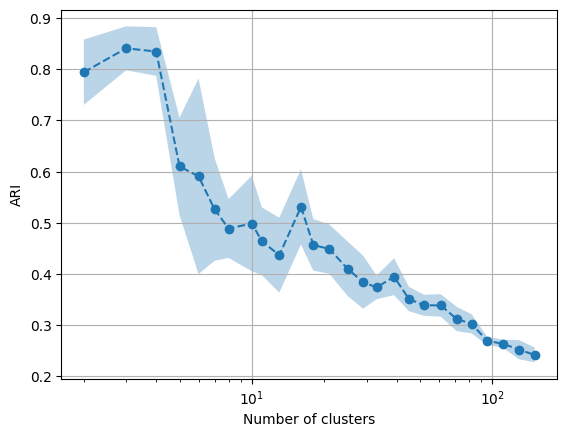

In [44]:
plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o')
plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
plt.xscale('log')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )

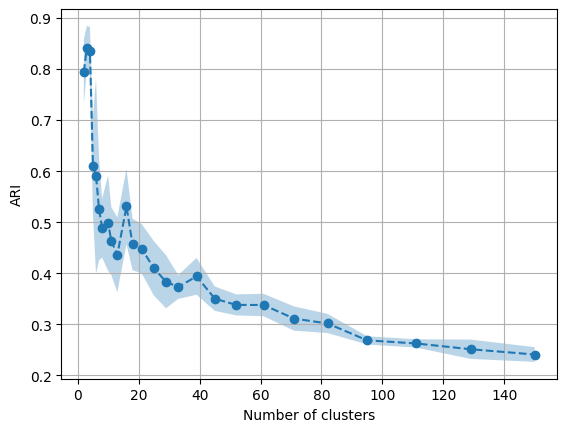

In [45]:
plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o')
plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )

### GMM seeds control

In [46]:
ari_mean_2_gmm = {}
ari_std_2_gmm = {}
for pc in tqdm(potential_clusters):
    bef_ari = []
    uq_emb = unique_embeddings[0]
    for s in [17, 23, 37, 43, 59, 73]: #[0, 42, 123, 246, 369]:
        bef_ari.append(
            GaussianMixture(
#             {‘full’, ‘tied’, ‘diag’, ‘spherical’},
            n_components=pc, covariance_type='spherical', random_state=s,
            tol=0.001, reg_covar=1e-05, max_iter=100, n_init=1, init_params='k-means++'
        ).fit_predict(uq_emb)
        )
    scores = []    
    for i, j in list(combinations(range(6), 2)):
        scores.append(
            adjusted_rand_score(bef_ari[i], bef_ari[j])
        )
        
    ari_mean_2_gmm[pc] = np.mean(scores)
    ari_std_2_gmm[pc] = np.std(scores, ddof=1)

 12%|████████████████████                                                                                                                                                          | 3/26 [00:11<01:30,  3.94s/it]/Users/polinaturishcheva/anaconda3/envs/sinz_2018/lib/python3.10/site-packages/sklearn/mixture/_base.py:275: ConvergenceWarning: Best performing initialization did not converge. Try different init parameters, or increase max_iter, tol, or check for degenerate data.
  warnings.warn(
 15%|██████████████████████████▊                                                                                                                                                   | 4/26 [00:18<01:53,  5.18s/it]/Users/polinaturishcheva/anaconda3/envs/sinz_2018/lib/python3.10/site-packages/sklearn/mixture/_base.py:275: ConvergenceWarning: Best performing initialization did not converge. Try different init parameters, or increase max_iter, tol, or check for degenerate data.
  warnings.warn(
 92%|█████████

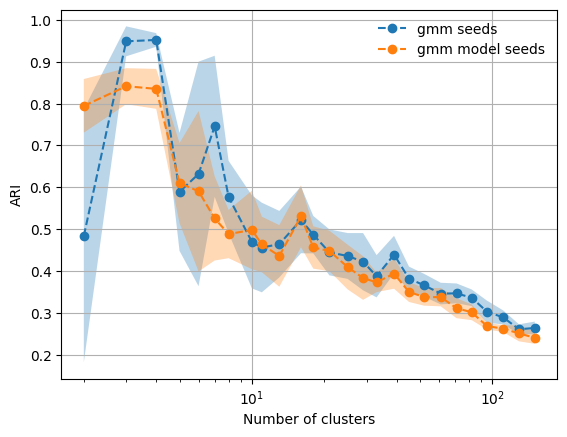

In [47]:
plt.plot(potential_clusters, list(ari_mean_2_gmm.values()), ls='--', marker='o', label='gmm seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_2_gmm.values())) - np.asarray(list(ari_std_2_gmm.values())),
                 np.asarray(list(ari_mean_2_gmm.values())) + np.asarray(list(ari_std_2_gmm.values())),
                 alpha=0.3
                )


plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o', label='gmm model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
plt.xscale('log')
plt.legend(frameon=False)

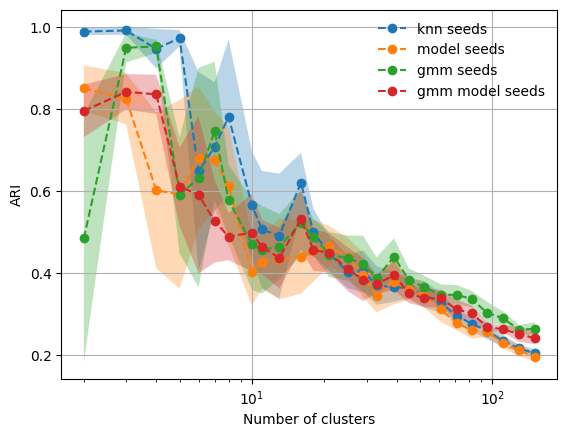

In [48]:
plt.plot(potential_clusters, list(ari_mean_2.values()), ls='--', marker='o', label='knn seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_2.values())) - np.asarray(list(ari_std_2.values())),
                 np.asarray(list(ari_mean_2.values())) + np.asarray(list(ari_std_2.values())),
                 alpha=0.3
                )


plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )
# -------


plt.plot(potential_clusters, list(ari_mean_2_gmm.values()), ls='--', marker='o', label='gmm seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_2_gmm.values())) - np.asarray(list(ari_std_2_gmm.values())),
                 np.asarray(list(ari_mean_2_gmm.values())) + np.asarray(list(ari_std_2_gmm.values())),
                 alpha=0.3
                )


plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o', label='gmm model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
plt.xscale('log')
plt.legend(frameon=False)

In [71]:
# !mkdir 11_mice_intermediate_files

In [72]:
aris_dict = {}
aris_dict['ari_mean_2'] = ari_mean_2
aris_dict['ari_mean'] = ari_mean
aris_dict['ari_mean_2_gmm'] = ari_mean_2_gmm
aris_dict['ari_mean_gmm'] = ari_mean_gmm
aris_dict['ari_mean_gmm_control'] = ari_mean_gmm_control


aris_dict['ari_std_2'] = ari_std_2
aris_dict['ari_std'] = ari_std
aris_dict['ari_std_2_gmm'] = ari_std_2_gmm
aris_dict['ari_std_gmm'] = ari_std_gmm
aris_dict['ari_std_gmm_control'] = ari_std_gmm_control


In [74]:
import pickle

In [75]:
# with open("11_mice_intermediate_files/aris_dict.pkl", "wb") as f:
#     pickle.dump(aris_dict, f)

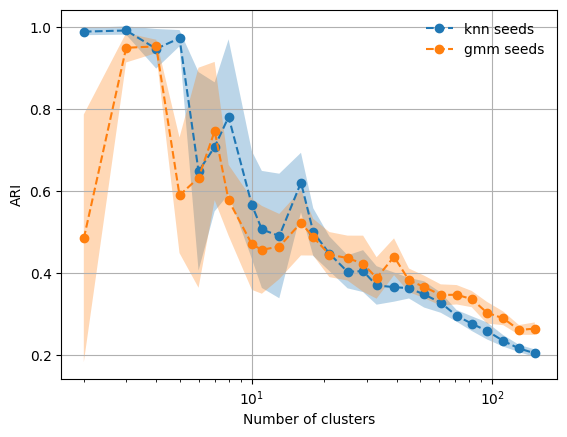

In [49]:
plt.plot(potential_clusters, list(ari_mean_2.values()), ls='--', marker='o', label='knn seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_2.values())) - np.asarray(list(ari_std_2.values())),
                 np.asarray(list(ari_mean_2.values())) + np.asarray(list(ari_std_2.values())),
                 alpha=0.3
                )


# plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds')
# plt.fill_between(potential_clusters,
#                  np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
#                  np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
#                  alpha=0.3
#                 )
# -------


plt.plot(potential_clusters, list(ari_mean_2_gmm.values()), ls='--', marker='o', label='gmm seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_2_gmm.values())) - np.asarray(list(ari_std_2_gmm.values())),
                 np.asarray(list(ari_mean_2_gmm.values())) + np.asarray(list(ari_std_2_gmm.values())),
                 alpha=0.3
                )


# plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o', label='gmm model seeds')
# plt.fill_between(potential_clusters,
#                  np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
#                  np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
#                  alpha=0.3
#                 )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
plt.xscale('log')
plt.legend(frameon=False)

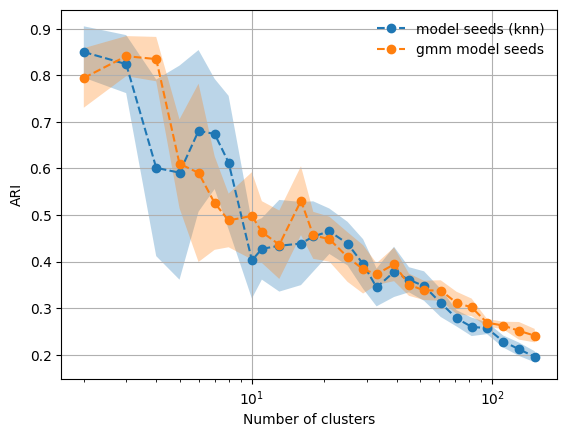

In [50]:
# plt.plot(potential_clusters, list(ari_mean_2.values()), ls='--', marker='o', label='knn seeds')
# plt.fill_between(potential_clusters,
#                  np.asarray(list(ari_mean_2.values())) - np.asarray(list(ari_std_2.values())),
#                  np.asarray(list(ari_mean_2.values())) + np.asarray(list(ari_std_2.values())),
#                  alpha=0.3
#                 )


plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds (knn)')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )
# -------


# plt.plot(potential_clusters, list(ari_mean_2_gmm.values()), ls='--', marker='o', label='gmm seeds')
# plt.fill_between(potential_clusters,
#                  np.asarray(list(ari_mean_2_gmm.values())) - np.asarray(list(ari_std_2_gmm.values())),
#                  np.asarray(list(ari_mean_2_gmm.values())) + np.asarray(list(ari_std_2_gmm.values())),
#                  alpha=0.3
#                 )


plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o', label='gmm model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
plt.xscale('log')
plt.legend(frameon=False)

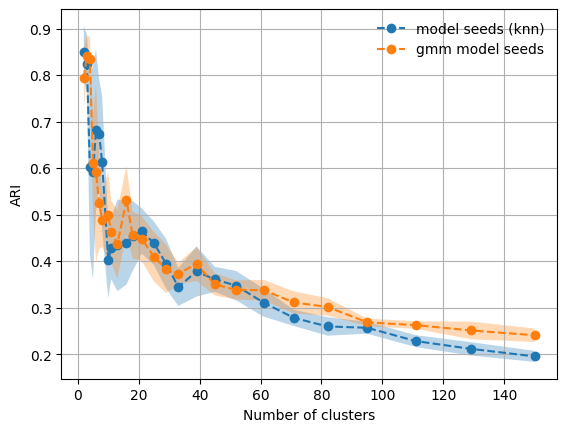

In [51]:
# plt.plot(potential_clusters, list(ari_mean_2.values()), ls='--', marker='o', label='knn seeds')
# plt.fill_between(potential_clusters,
#                  np.asarray(list(ari_mean_2.values())) - np.asarray(list(ari_std_2.values())),
#                  np.asarray(list(ari_mean_2.values())) + np.asarray(list(ari_std_2.values())),
#                  alpha=0.3
#                 )


plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds (knn)')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )
# -------


# plt.plot(potential_clusters, list(ari_mean_2_gmm.values()), ls='--', marker='o', label='gmm seeds')
# plt.fill_between(potential_clusters,
#                  np.asarray(list(ari_mean_2_gmm.values())) - np.asarray(list(ari_std_2_gmm.values())),
#                  np.asarray(list(ari_mean_2_gmm.values())) + np.asarray(list(ari_std_2_gmm.values())),
#                  alpha=0.3
#                 )


plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o', label='gmm model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
# plt.xscale('log')
plt.legend(frameon=False)

(2.0, 60.0)

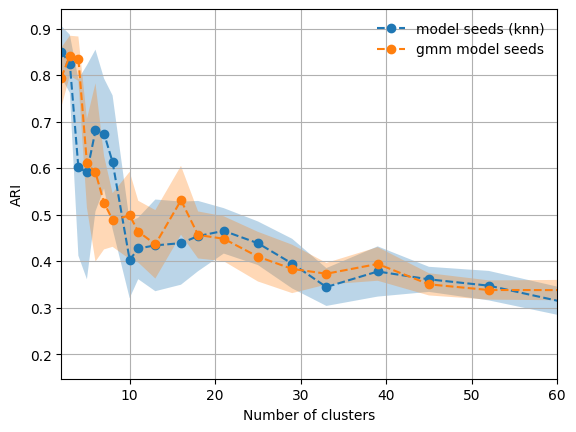

In [62]:
# plt.plot(potential_clusters, list(ari_mean_2.values()), ls='--', marker='o', label='knn seeds')
# plt.fill_between(potential_clusters,
#                  np.asarray(list(ari_mean_2.values())) - np.asarray(list(ari_std_2.values())),
#                  np.asarray(list(ari_mean_2.values())) + np.asarray(list(ari_std_2.values())),
#                  alpha=0.3
#                 )


plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds (knn)')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )
# -------


# plt.plot(potential_clusters, list(ari_mean_2_gmm.values()), ls='--', marker='o', label='gmm seeds')
# plt.fill_between(potential_clusters,
#                  np.asarray(list(ari_mean_2_gmm.values())) - np.asarray(list(ari_std_2_gmm.values())),
#                  np.asarray(list(ari_mean_2_gmm.values())) + np.asarray(list(ari_std_2_gmm.values())),
#                  alpha=0.3
#                 )


plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o', label='gmm model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
# plt.xscale('log')
plt.legend(frameon=False)
plt.xlim(2, 60)

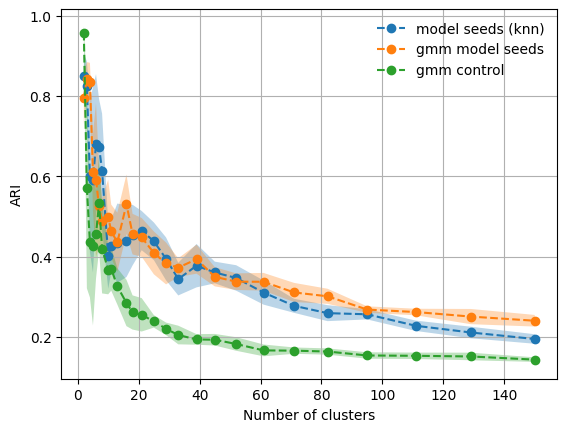

In [67]:
plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds (knn)')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )
# -------



plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o', label='gmm model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )

plt.plot(potential_clusters, list(ari_mean_gmm_control.values()), ls='--', marker='o', label='gmm control')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm_control.values())) - np.asarray(list(ari_std_gmm_control.values())),
                 np.asarray(list(ari_mean_gmm_control.values())) + np.asarray(list(ari_std_gmm_control.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
# plt.xscale('log')
plt.legend(frameon=False)
# plt.xlim(2, 60)

(2.0, 60.0)

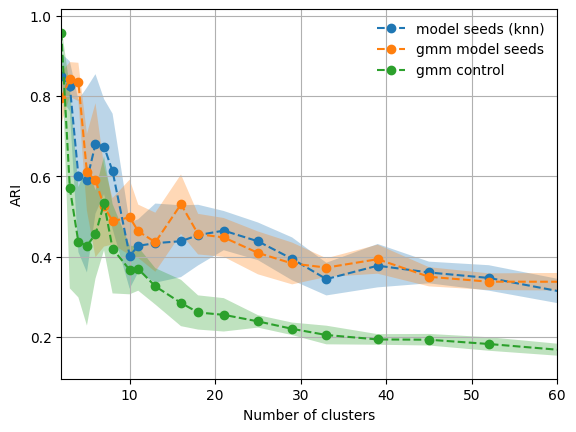

In [70]:
plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds (knn)')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )
# -------



plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o', label='gmm model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )

plt.plot(potential_clusters, list(ari_mean_gmm_control.values()), ls='--', marker='o', label='gmm control')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm_control.values())) - np.asarray(list(ari_std_gmm_control.values())),
                 np.asarray(list(ari_mean_gmm_control.values())) + np.asarray(list(ari_std_gmm_control.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
# plt.xscale('log')
plt.legend(frameon=False)
plt.xlim(2, 60)

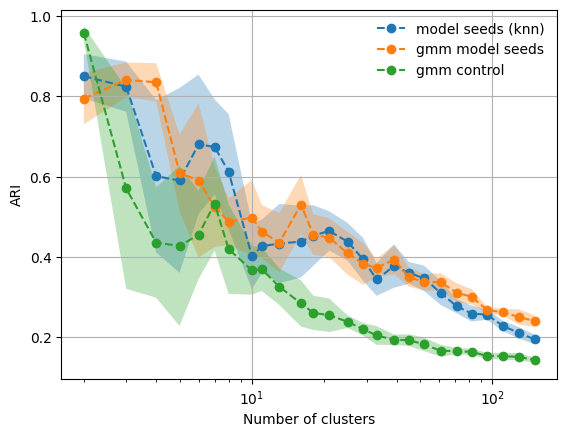

In [68]:
plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds (knn)')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )
# -------



plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o', label='gmm model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )

plt.plot(potential_clusters, list(ari_mean_gmm_control.values()), ls='--', marker='o', label='gmm control')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm_control.values())) - np.asarray(list(ari_std_gmm_control.values())),
                 np.asarray(list(ari_mean_gmm_control.values())) + np.asarray(list(ari_std_gmm_control.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
plt.xscale('log')
plt.legend(frameon=False)
# plt.xlim(2, 60)

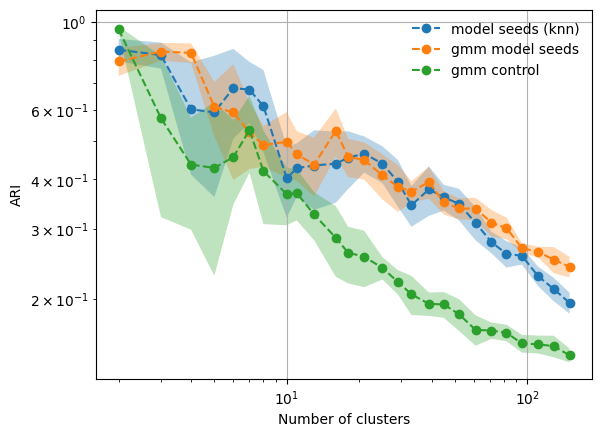

In [69]:
plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds (knn)')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )
# -------



plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o', label='gmm model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )

plt.plot(potential_clusters, list(ari_mean_gmm_control.values()), ls='--', marker='o', label='gmm control')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm_control.values())) - np.asarray(list(ari_std_gmm_control.values())),
                 np.asarray(list(ari_mean_gmm_control.values())) + np.asarray(list(ari_std_gmm_control.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
plt.xscale('log')
plt.yscale('log')
plt.legend(frameon=False)
# plt.xlim(2, 60)

(0.15, 0.85)

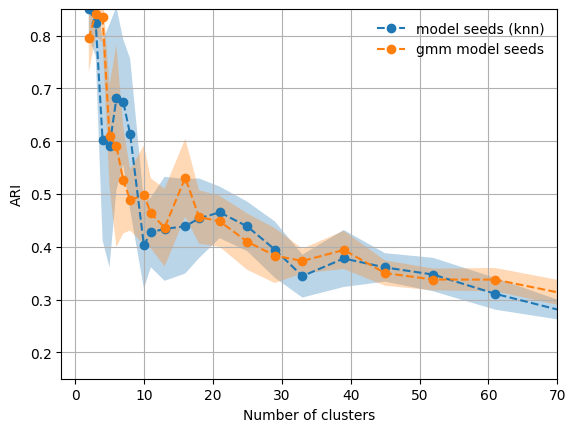

In [65]:
# plt.plot(potential_clusters, list(ari_mean_2.values()), ls='--', marker='o', label='knn seeds')
# plt.fill_between(potential_clusters,
#                  np.asarray(list(ari_mean_2.values())) - np.asarray(list(ari_std_2.values())),
#                  np.asarray(list(ari_mean_2.values())) + np.asarray(list(ari_std_2.values())),
#                  alpha=0.3
#                 )


plt.plot(potential_clusters, list(ari_mean.values()), ls='--', marker='o', label='model seeds (knn)')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean.values())) - np.asarray(list(ari_std.values())),
                 np.asarray(list(ari_mean.values())) + np.asarray(list(ari_std.values())),
                 alpha=0.3
                )
# -------


# plt.plot(potential_clusters, list(ari_mean_2_gmm.values()), ls='--', marker='o', label='gmm seeds')
# plt.fill_between(potential_clusters,
#                  np.asarray(list(ari_mean_2_gmm.values())) - np.asarray(list(ari_std_2_gmm.values())),
#                  np.asarray(list(ari_mean_2_gmm.values())) + np.asarray(list(ari_std_2_gmm.values())),
#                  alpha=0.3
#                 )


plt.plot(potential_clusters, list(ari_mean_gmm.values()), ls='--', marker='o', label='gmm model seeds')
plt.fill_between(potential_clusters,
                 np.asarray(list(ari_mean_gmm.values())) - np.asarray(list(ari_std_gmm.values())),
                 np.asarray(list(ari_mean_gmm.values())) + np.asarray(list(ari_std_gmm.values())),
                 alpha=0.3
                )


plt.grid()
plt.ylabel('ARI')
plt.xlabel('Number of clusters')
# plt.xscale('log')
plt.legend(frameon=False)
plt.xlim(-2, 70)
plt.ylim(0.15, 0.85)

In [58]:
X = unique_embeddings[0]
mu, C = X.mean(0), np.cov(X.T)
L = np.linalg.cholesky(C + 1e-6*np.eye(X.shape[1]))
G  = mu + np.random.default_rng(0).standard_normal(X.shape)   @ L.T
# gauss_kmeans_12mice = ari_curve([G]*5, [0, 42, 123, 246, 369])

In [59]:
ari_mean_gmm_control = {}
ari_std_gmm_control = {}
for pc in tqdm(potential_clusters):
    bef_ari = []
    uq_emb = G 
    for s in [17, 23, 37, 43, 59, 73]: 
        bef_ari.append(
            GaussianMixture(
#             {‘full’, ‘tied’, ‘diag’, ‘spherical’},
            n_components=pc, covariance_type='spherical', random_state=s,
            tol=0.001, reg_covar=1e-05, max_iter=100, n_init=1, init_params='k-means++'
        ).fit_predict(uq_emb)
        )
    scores = []    
    for i, j in list(combinations(range(6), 2)):
        scores.append(
            adjusted_rand_score(bef_ari[i], bef_ari[j])
        )
        
    ari_mean_gmm_control[pc] = np.mean(scores)
    ari_std_gmm_control[pc] = np.std(scores, ddof=1)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [14:44<00:00, 34.03s/it]


### t-SNE and color by x

In [53]:
unique_embeddings[0].shape

(40722, 96)

In [54]:
#12-47 running
X_embedded = TSNE(n_components=2).fit_transform(unique_embeddings[0].copy())

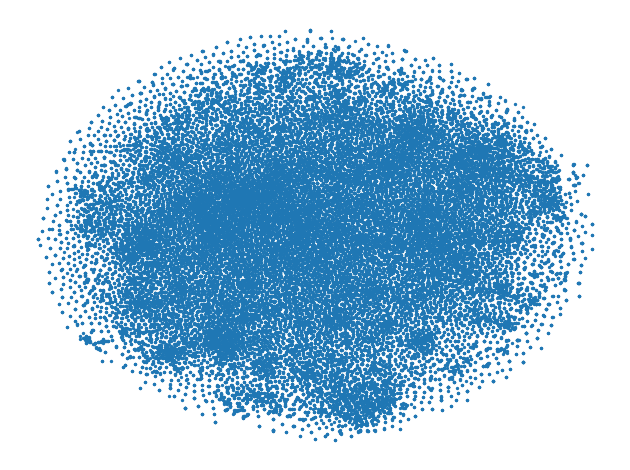

In [55]:
plt.scatter(
    X_embedded[:, 0], X_embedded[:, 1],
#     alpha=0.7, 
    s=2
)

plt.xticks([])  # Remove x ticks
plt.yticks([])  # Remove y ticks
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.tight_layout()
plt.show()

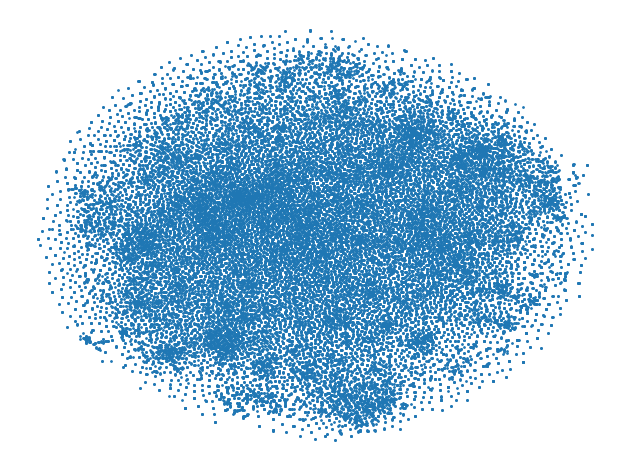

In [56]:
plt.scatter(
    X_embedded[:, 0], X_embedded[:, 1],
#     alpha=0.7, 
    s=1
)

plt.xticks([])  # Remove x ticks
plt.yticks([])  # Remove y ticks
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.tight_layout()
plt.show()

### Ok - lets do bootstrapping now as before and how many mice do we need to hold it up and do t-sne properly colored

In [1]:
import torch
import numpy as np
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
from tqdm import tqdm

from sklearn.metrics import adjusted_rand_score
from itertools import combinations
import seaborn as sns
from scipy.stats import gaussian_kde
from scipy.spatial.distance import cdist
from sklearn.manifold import TSNE
import os
from scanpy.tl import leiden

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from itertools import combinations

/Users/polinaturishcheva/anaconda3/envs/sinz_2018/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/polinaturishcheva/anaconda3/envs/sinz_2018/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/Users/polinaturishcheva/anaconda3/envs/sinz_2018/lib/python3.10/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
def whiten_readouts(cov_ema, readouts, eps=1e-5):
    eye = torch.eye(cov_ema.shape[0], dtype=cov_ema.dtype, device='cpu')
    L = torch.linalg.cholesky(cov_ema + eps * eye)

    whitened_readouts = L.T @ readouts.T
    return whitened_readouts.T

In [3]:
example = torch.load(
    '11_mice_model/11mice_seed17.pth',
      map_location=torch.device('cpu'))

animals = list(set(
    [i.split('.')[1] for i in list(example.keys()) if 'readout' in i]
))

animals

['21067-10-18',
 '23343-5-17',
 '22564-2-12',
 '22620-4-15',
 '22846-10-16',
 '22223-2-15',
 '23964-4-22',
 '27204-5-13',
 '23555-5-12',
 '20457-5-9',
 '23656-14-22']

In [4]:
models = {}
for s in [17, 23, 37, 43, 59, 73]:
    path = f'11_mice_model/11mice_seed{s}.pth'
    seed_w = torch.load(path, map_location=torch.device('cpu'))
    models[s] = {}
    for a in animals:
        models[s][a] = seed_w[f'readout.{a}._features'].squeeze().numpy()
    models[s]['mu_ema'] = seed_w['whitener.mu_ema'].numpy()
    models[s]['cov_ema'] = seed_w['whitener.cov_ema'].numpy()

In [5]:
# per animal -> list over the 3 seeds of whitened readouts
whitened_per_animal = {}
for a in animals:
    per_seed = []
    for s in models.keys():
        rr = torch.from_numpy(models[s][a])
        rr_w = whiten_readouts(torch.from_numpy(models[s]['cov_ema']), rr)
        per_seed.append(rr_w.numpy())
    whitened_per_animal[a] = per_seed

In [6]:
path_dict = {}
path_link = {}
for a in animals:
    if a in ['23343-5-17',
             '22846-10-16',
             '26872-17-20',
             '21067-10-18',
             '23656-14-22',
             '23964-4-22',
             '27204-5-13']:
        path_dict[a] = '/Users/polinaturishcheva/Desktop/nathan_stuff/sensorium_data/'
        path_link[a] = '-GrayImageNet-'
    else:
        path_dict[a] = '/Users/polinaturishcheva/Desktop/nathan_stuff/move_to_phobos/'
        path_link[a] = '-'

In [7]:
coords = {}
for a in animals:
    coords[a] = np.load(
        f'{path_dict[a]}static{a}{path_link[a]}94c6ff995dac583098847cfecd43e7b6/meta/neurons/cell_motor_coordinates.npy'
    )

def load_responses(animal_id):
    path = f'{path_dict[animal_id]}/static{animal_id}{path_link[animal_id]}94c6ff995dac583098847cfecd43e7b6/data/responses/'
    n = len(os.listdir(path))
    return np.vstack([np.load(f'{path}{j}.npy') for j in range(n)]).T  # (neurons, images)

In [8]:
RADIUS = 4
CORR_THRESHOLD = 0.8

def dedup_animal(coords_a, responses_a):
    n = len(coords_a)
    def corr(x, y):
        x = x - x.mean(); y = y - y.mean()
        return np.dot(x, y) / np.sqrt(np.dot(x, x) * np.dot(y, y))

    def walk_z(planes, z_order, target_resp, prev_xy):
        copies = []
        for z in z_order:
            gidx, x, y = min(planes[z], key=lambda t: abs(t[1]-prev_xy[0]) + abs(t[2]-prev_xy[1]))
            if abs(x-prev_xy[0]) > RADIUS or abs(y-prev_xy[1]) > RADIUS:
                break
            if corr(target_resp, responses_a[gidx]) <= CORR_THRESHOLD:
                break
            copies.append(gidx)
            prev_xy = (x, y)
        return copies

    planes = {}
    for g in range(n):
        x, y, z = coords_a[g]
        planes.setdefault(z, []).append((g, x, y))
    sorted_z = sorted(planes)

    copy_dict = {}
    for g in range(n):
        x, y, z = coords_a[g]
        target = responses_a[g]
        up   = [zz for zz in sorted_z if zz > z]
        down = [zz for zz in sorted_z if zz < z][::-1]
        copies = walk_z(planes, up, target, (x, y)) + walk_z(planes, down, target, (x, y))
        if copies:
            copy_dict[g] = copies

    parent = {}
    def find(x):
        parent.setdefault(x, x)
        while parent[x] != x:
            parent[x] = parent[parent[x]]; x = parent[x]
        return x
    def union(a, b):
        parent[find(a)] = find(b)
    for neuron, copies in copy_dict.items():
        for c in copies:
            union(neuron, c)

    groups = {}
    for node in parent:
        groups.setdefault(find(node), set()).add(node)
    unique_groups = list(groups.values())
    grouped = set().union(*unique_groups) if unique_groups else set()
    individual_neurons = sorted(set(range(n)) - grouped)
    return unique_groups, individual_neurons

In [9]:
per_animal_embeddings = {}   # a -> list of 3 seed embeddings (deduped, whitened)
for a in tqdm(animals):
    responses_a = load_responses(a)
    unique_groups, individual_neurons = dedup_animal(coords[a], responses_a)
    seeds_emb = []
    for wh in whitened_per_animal[a]:
        grp = (np.stack([wh[list(g)].mean(0) for g in unique_groups])
               if unique_groups else np.empty((0, wh.shape[1])))
        seeds_emb.append(np.vstack([wh[individual_neurons], grp]))
    per_animal_embeddings[a] = seeds_emb
    print(a, seeds_emb[0].shape)

  9%|███████████████▊                                                                                                                                                              | 1/11 [00:08<01:22,  8.27s/it]

21067-10-18 (3643, 96)


 18%|███████████████████████████████▋                                                                                                                                              | 2/11 [00:14<01:04,  7.20s/it]

23343-5-17 (3185, 96)


 27%|███████████████████████████████████████████████▍                                                                                                                              | 3/11 [00:19<00:47,  5.98s/it]

22564-2-12 (8073, 96)


 36%|███████████████████████████████████████████████████████████████▎                                                                                                              | 4/11 [00:27<00:47,  6.73s/it]

22620-4-15 (3446, 96)


 45%|███████████████████████████████████████████████████████████████████████████████                                                                                               | 5/11 [00:33<00:40,  6.70s/it]

22846-10-16 (3323, 96)


 55%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 6/11 [00:35<00:24,  4.99s/it]

22223-2-15 (2937, 96)


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 7/11 [00:42<00:23,  5.76s/it]

23964-4-22 (3866, 96)


 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 8/11 [00:51<00:19,  6.58s/it]

27204-5-13 (2835, 96)


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 9/11 [00:56<00:12,  6.31s/it]

23555-5-12 (3178, 96)


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 10/11 [01:01<00:05,  5.88s/it]

20457-5-9 (2497, 96)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [01:09<00:00,  6.32s/it]

23656-14-22 (3739, 96)


In [10]:
def knn_consistency(knn1, knn2, ks):
    N, k_max = knn1.shape
    #idcs = torch.randperm(N)
    #knn2 = knn2[idcs]
    
    assert ks[-1] <= k_max 
    ranking = np.full((N, N), N, dtype=np.int32)  # Shape (N, N)
    ranking[np.arange(N)[:, None], knn1] = np.arange(k_max)[None]
    overlaps = []

    for k in tqdm(ks):
        neighbours = knn2[:, :k]  # Shape (N, k)
        shared = ranking[np.arange(N)[:, None], neighbours] < k  # Shape (N, k)
        num_shared = shared.sum() / N
        
        overlap = num_shared / k
        overlaps.append(overlap)

    return np.array(overlaps)


def get_curve(k_range, all_features):
    knns = []
    for features in tqdm(all_features):
        nn = NearestNeighbors(n_neighbors=k_range[-1]).fit(features)
        knn = nn.kneighbors(return_distance=False)
        knns.append(knn)

    x_idcs, y_idcs = np.tril_indices(len(all_features), k=-1)

    curves = []
    for x, y in zip(x_idcs, y_idcs):
        curves.append(knn_consistency(knns[x], knns[y], ks=k_range))

    curves = np.asarray(curves)          # (num_pairs, len(k_range))
    curve_mean = curves.mean(axis=0)
    curve_std = curves.std(axis=0)

    return curve_mean, curve_std

In [11]:
k_range = np.unique(np.geomspace(1, 1500, num=150, dtype=int))

In [12]:
k_range

array([   1,    2,    3,    4,    5,    6,    7,    8,    9,   10,   11,
         12,   13,   14,   15,   16,   17,   18,   19,   20,   22,   23,
         24,   25,   26,   28,   29,   31,   32,   34,   35,   37,   39,
         41,   43,   45,   48,   50,   53,   55,   58,   61,   64,   68,
         71,   75,   78,   82,   87,   91,   96,  100,  105,  111,  116,
        122,  128,  135,  142,  149,  156,  164,  173,  181,  190,  200,
        210,  221,  232,  244,  256,  269,  282,  296,  311,  327,  344,
        361,  379,  398,  418,  439,  461,  485,  509,  535,  562,  590,
        620,  651,  683,  718,  754,  792,  832,  874,  918,  964, 1012,
       1063, 1117, 1173, 1232, 1294, 1359, 1428, 1500])

In [13]:
len(k_range)

107

In [14]:
per_animal_embeddings[a][0].shape

(3739, 96)

In [15]:
knn_curves = {}
for a in animals:
    embs = per_animal_embeddings[a]
    N = embs[0].shape[0]
    kr = k_range[k_range < N]            # clamp: per-animal N is smaller
    knn_curves[a] = (kr, get_curve(kr, embs))

# for a in animals:
#     kr, curve, curve_std = knn_curves[a]
#     plt.plot(kr, curve, marker='o', ms=3, label=a)
# plt.xlabel('num neighbors'); plt.ylabel('knn consistency')
# plt.xscale('log'); plt.legend(frameon=False); plt.show()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 107/107 [00:02<00:00, 46.44it/s]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 107/107 [00:00<00:00, 162.19it/s]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 107/107 [00:00<00:00, 192.53it/s]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 107/107 [00:00<00:00, 226.06it/s]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 107/107 [00:00<00:00, 127.69it/s]


In [16]:
per_animal_embeddings[a][0].shape[0]

3739

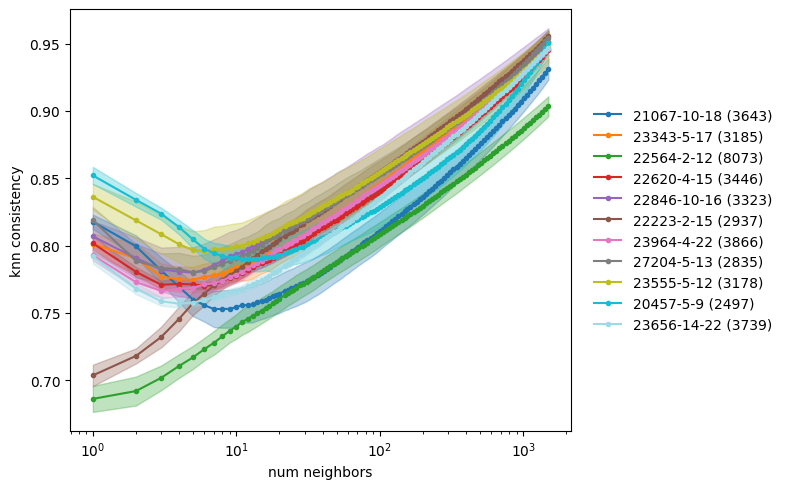

In [17]:
plt.figure(figsize=(8, 5))
colors = plt.cm.tab20(np.linspace(0, 1, len(animals)))
for a, c in zip(animals, colors):
    kr, (curve, curve_std) = knn_curves[a]
    plt.plot(kr, curve, marker='o', color=c, ms=3, label=f'{a} ({per_animal_embeddings[a][0].shape[0]})')
    plt.fill_between(kr, 
                     curve - curve_std,
                     curve + curve_std,
                     alpha=0.3,
                     color=c, 
                    )
plt.xlabel('num neighbors'); plt.ylabel('knn consistency')
plt.xscale('log'); plt.legend(frameon=False,loc='center left', bbox_to_anchor=(1.02, 0.5)); 
plt.tight_layout(); plt.show()

In [94]:
potential_clusters = np.unique(np.geomspace(2, 150, num=30, dtype=int))

def ari_curve(embeddings_list, seeds):
    """embeddings_list + seeds -> (mean, std) over pairwise ARI at each pc.
    Pass 3 embeddings with a single seed (model-seed test),
    or 1 embedding repeated with 3 seeds (k-means stability)."""
    means, stds = [], []
    for pc in potential_clusters:
        labels = [KMeans(n_clusters=pc, n_init='auto', random_state=s).fit(e).labels_
                  for e, s in zip(embeddings_list, seeds)]
        scores = [adjusted_rand_score(labels[i], labels[j]) for i, j in combinations(range(6), 2)]
        means.append(np.mean(scores)); stds.append(np.std(scores, ddof=1))
    return np.array(means), np.array(stds)

ari_model, ari_kmeans = {}, {}
for a in tqdm(animals):
    embs = per_animal_embeddings[a]
    ari_model[a]  = ari_curve(embs, [42] * 6)          # 3 model seeds, fixed km seed
    ari_kmeans[a] = ari_curve([embs[0]]*6, [17, 23, 37, 43, 59, 73])   # 1 embedding, 3 km seeds

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [12:16<00:00, 66.94s/it]


In [95]:
gauss_model, gauss_kmeans = {}, {}
for a in tqdm(animals):
    X = per_animal_embeddings[a][0]
    mu, C = X.mean(0), np.cov(X.T)
    L = np.linalg.cholesky(C + 1e-6*np.eye(X.shape[1]))
    G  = mu + np.random.default_rng(0).standard_normal(X.shape)   @ L.T
    gauss_kmeans[a] = ari_curve([G]*6, [17, 23, 37, 43, 59, 73])

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [06:47<00:00, 37.05s/it]


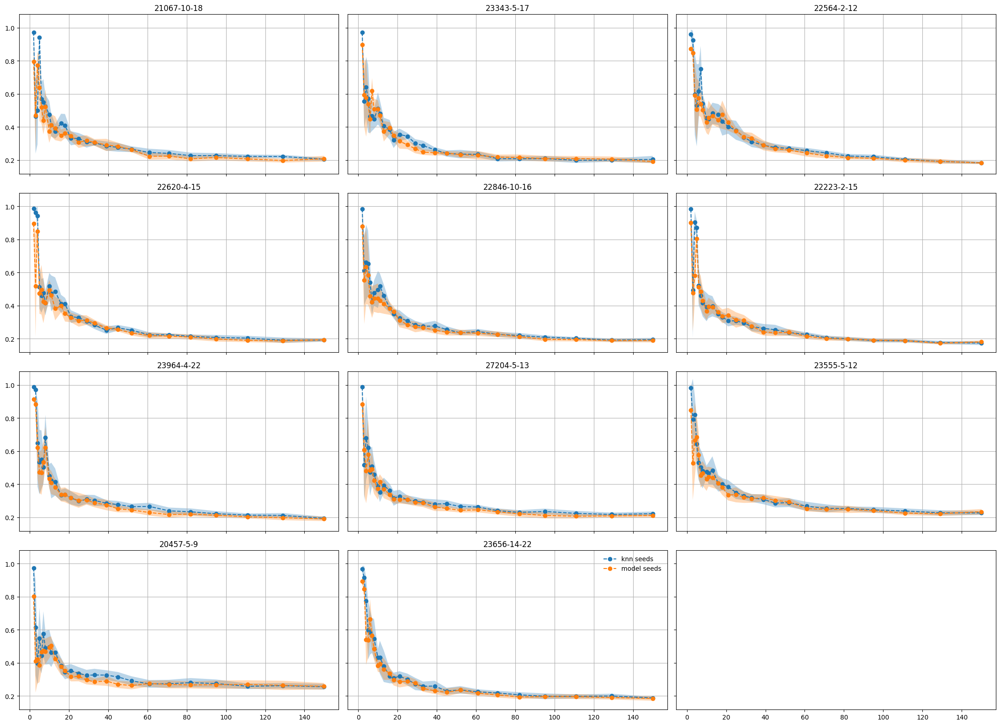

In [96]:
fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 16))
axes = axes.flatten()

for idx, a in enumerate(animals):
#     (ari_kmeans, 'knn seeds'), (ari_model, 'model seeds')
    ax = axes[idx]
    
    m, sd = ari_kmeans[a]
    ax.plot(potential_clusters, m, ls='--', marker='o', label='knn seeds')
    ax.fill_between(potential_clusters, (m-sd), (m+sd), alpha=0.3)
    
    m, sd = ari_model[a]
    ax.plot(potential_clusters, m, ls='--', marker='o', label='model seeds')
    ax.fill_between(potential_clusters, (m-sd), (m+sd), alpha=0.3)
    ax.grid()
    ax.set_title(a)
    if idx == len(animals) - 1 :
        ax.legend(frameon=False)
plt.tight_layout()

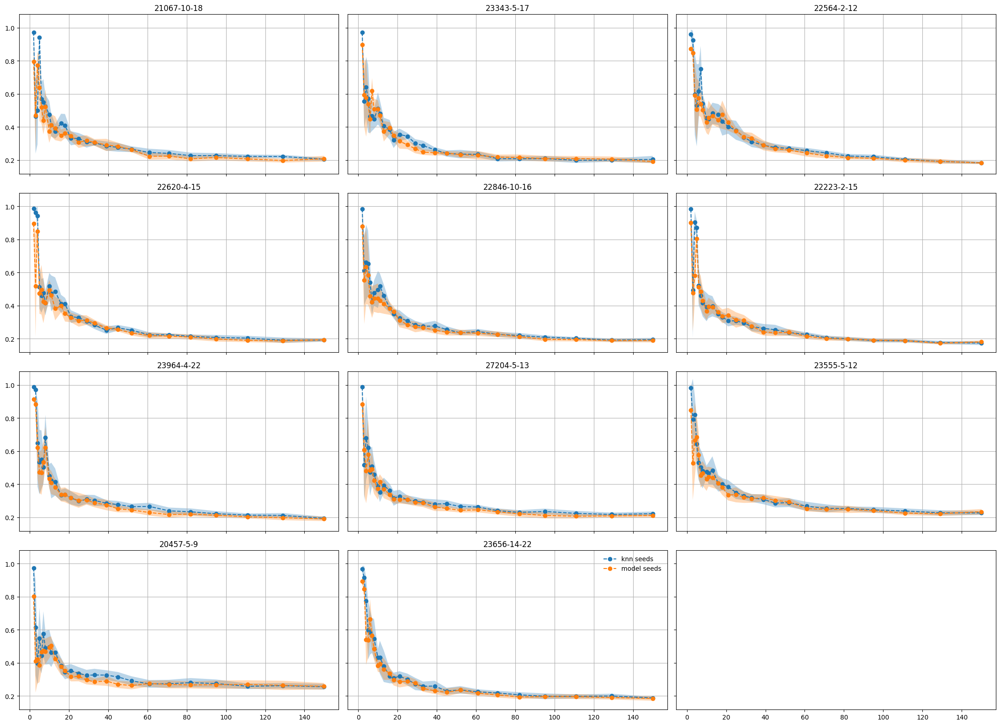

In [97]:
fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 16))
axes = axes.flatten()

for idx, a in enumerate(animals):
#     (ari_kmeans, 'knn seeds'), (ari_model, 'model seeds')
    ax = axes[idx]
    
    m, sd = ari_kmeans[a]
    ax.plot(potential_clusters, m, ls='--', marker='o', label='knn seeds')
    ax.fill_between(potential_clusters, (m-sd), (m+sd), alpha=0.3)
    
    m, sd = ari_model[a]
    ax.plot(potential_clusters, m, ls='--', marker='o', label='model seeds')
    ax.fill_between(potential_clusters, (m-sd), (m+sd), alpha=0.3)
    ax.grid()
    ax.set_title(a)
    if idx == len(animals) - 1 :
        ax.legend(frameon=False)
plt.tight_layout()

In [98]:
potential_clusters

array([  2,   3,   4,   5,   6,   7,   8,  10,  11,  13,  16,  18,  21,
        25,  29,  33,  39,  45,  52,  61,  71,  82,  95, 111, 129, 150])

In [99]:
potential_clusters[:19]

array([ 2,  3,  4,  5,  6,  7,  8, 10, 11, 13, 16, 18, 21, 25, 29, 33, 39,
       45, 52])

In [100]:
per_animal_embeddings[a][0].shape[0]

3739

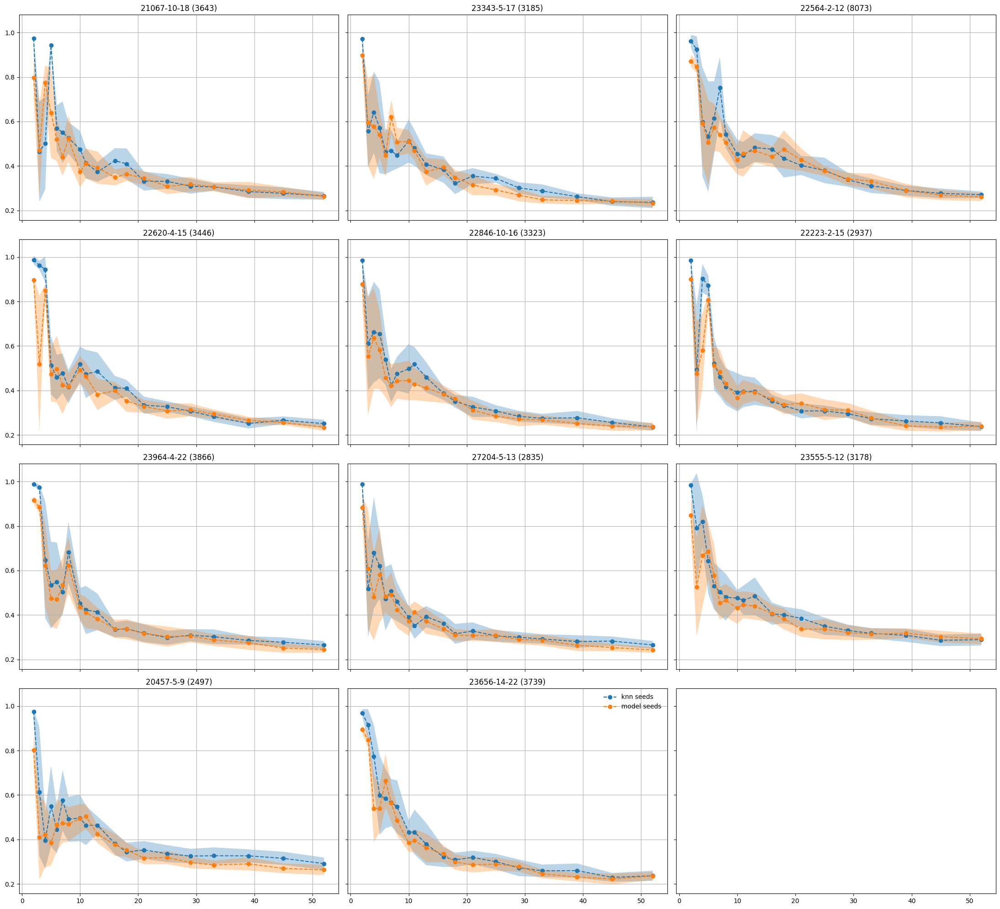

In [101]:
fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 20))
axes = axes.flatten()

for idx, a in enumerate(animals):
#     (ari_kmeans, 'knn seeds'), (ari_model, 'model seeds')
    ax = axes[idx]
    
    m, sd = ari_kmeans[a]
    ax.plot(potential_clusters[:19], m[:19], ls='--', marker='o', label='knn seeds')
    ax.fill_between(potential_clusters[:19], (m-sd)[:19], (m+sd)[:19], alpha=0.3)
    
    m, sd = ari_model[a]
    ax.plot(potential_clusters[:19], m[:19], ls='--', marker='o', label='model seeds')
    ax.fill_between(potential_clusters[:19], (m-sd)[:19], (m+sd)[:19], alpha=0.3)
    ax.grid()
    if '20892' not in a:
        ax.set_title(f'{a} ({per_animal_embeddings[a][0].shape[0]})')
    else:
        ax.set_title(f'{a} ({per_animal_embeddings[a][0].shape[0]}) - has NOT only V!')
#     ax.axvline(x=6, label='x=6')
    if idx == len(animals) - 1 :
        ax.legend(frameon=False)
        
plt.tight_layout()

In [102]:
potential_clusters[:15]

array([ 2,  3,  4,  5,  6,  7,  8, 10, 11, 13, 16, 18, 21, 25, 29])

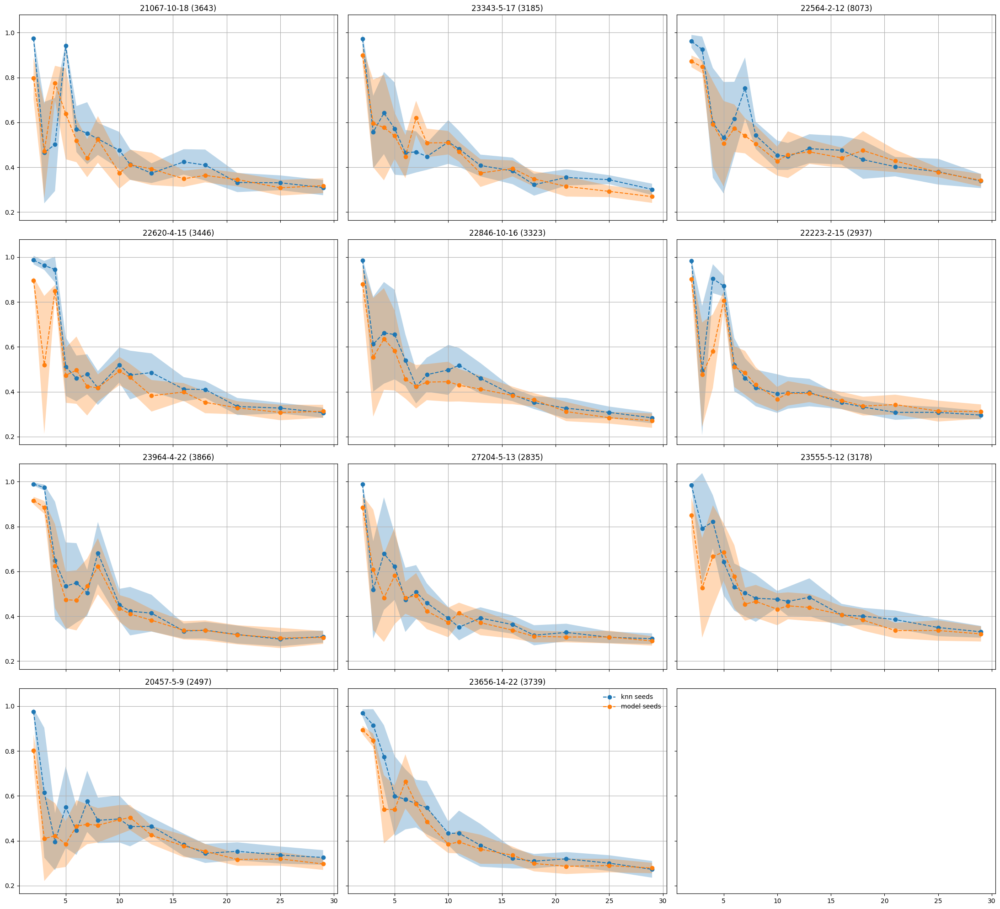

In [103]:
cut = 15
fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 20))
axes = axes.flatten()

for idx, a in enumerate(animals):
#     (ari_kmeans, 'knn seeds'), (ari_model, 'model seeds')
    ax = axes[idx]
    
    m, sd = ari_kmeans[a]
    ax.plot(potential_clusters[:cut], m[:cut], ls='--', marker='o', label='knn seeds')
    ax.fill_between(potential_clusters[:cut], (m-sd)[:cut], (m+sd)[:cut], alpha=0.3)
    
    m, sd = ari_model[a]
    ax.plot(potential_clusters[:cut], m[:cut], ls='--', marker='o', label='model seeds')
    ax.fill_between(potential_clusters[:cut], (m-sd)[:cut], (m+sd)[:cut], alpha=0.3)
    ax.grid()
    if '20892' not in a:
        ax.set_title(f'{a} ({per_animal_embeddings[a][0].shape[0]})')
    else:
        ax.set_title(f'{a} ({per_animal_embeddings[a][0].shape[0]}) - has NOT only V!')
#     ax.axvline(x=6, label='x=6')
    if idx == len(animals) - 1 :
        ax.legend(frameon=False)
        
plt.tight_layout()

### T-SNE colored by

In [33]:
all_together = []
mice_ids = []

for idx, a in enumerate(animals):
    all_together.append(per_animal_embeddings[a][0])
    mice_ids = mice_ids + [idx] * per_animal_embeddings[a][0].shape[0]

In [34]:
animals

['21067-10-18',
 '23343-5-17',
 '22564-2-12',
 '22620-4-15',
 '22846-10-16',
 '22223-2-15',
 '23964-4-22',
 '27204-5-13',
 '23555-5-12',
 '20457-5-9',
 '23656-14-22']

In [35]:
all_together_stacked = np.vstack(all_together)
all_together_stacked.shape

(40722, 96)

In [37]:
# 13-59
X_embedded = TSNE(n_components=2).fit_transform(all_together_stacked)

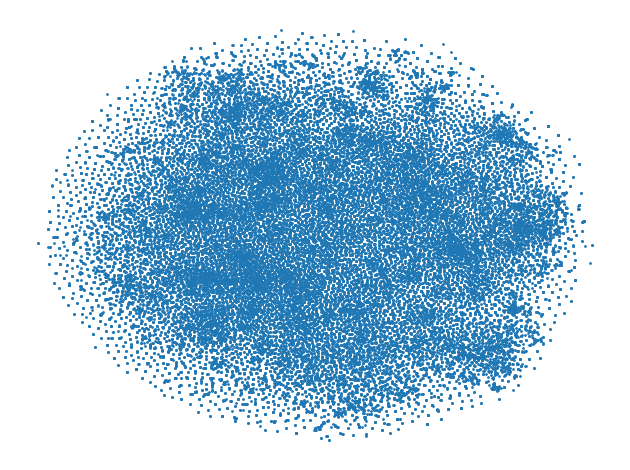

In [38]:
plt.scatter(
    X_embedded[:, 0], X_embedded[:, 1],
#     alpha=0.7, 
    s=1
)

plt.xticks([])  # Remove x ticks
plt.yticks([])  # Remove y ticks
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.tight_layout()
plt.show()

### by mouse

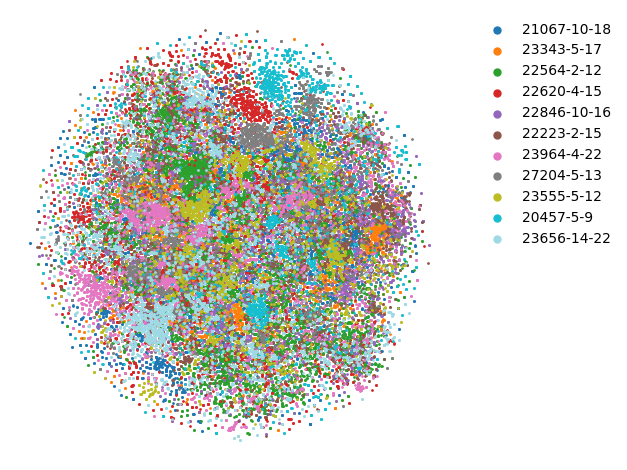

In [39]:
colors = plt.cm.tab20(np.linspace(0, 1, len(np.unique(mice_ids))))

for mouse_id, color in zip(np.unique(mice_ids), colors):
    mask = mice_ids == mouse_id
    plt.scatter(
        X_embedded[mask, 0], X_embedded[mask, 1],
        s=1,
        color=color,
        label=animals[mouse_id]
    )

plt.xticks([])
plt.yticks([])
for spine in plt.gca().spines.values():
    spine.set_visible(False)

plt.legend(frameon=False, bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=5)
plt.tight_layout()
plt.show()

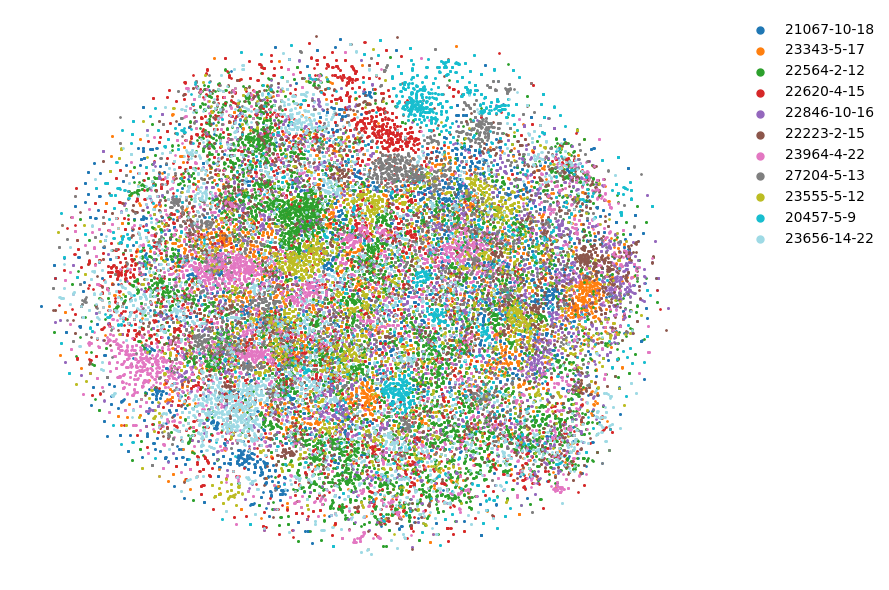

In [51]:
plt.figure(figsize=(9, 6))
colors = plt.cm.tab20(np.linspace(0, 1, len(np.unique(mice_ids))))

for mouse_id, color in zip(np.unique(mice_ids), colors):
    mask = mice_ids == mouse_id
    plt.scatter(
        X_embedded[mask, 0], X_embedded[mask, 1],
        s=1,
        color=color,
        label=animals[mouse_id]
    )

plt.xticks([])
plt.yticks([])
for spine in plt.gca().spines.values():
    spine.set_visible(False)

plt.legend(frameon=False, bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=5)
plt.tight_layout()
plt.show()

In [40]:
# colors = plt.cm.tab20(np.linspace(0, 1, len(np.unique(mice_ids))))

# for mouse_id, color in zip(np.unique(mice_ids), colors):
#     if '20892' not in animals[mouse_id]:
#         mask = mice_ids == mouse_id
#         plt.scatter(
#             X_embedded[mask, 0], X_embedded[mask, 1],
#             s=1,
#             color=color,
#             label=f'{animals[mouse_id]} ({per_animal_embeddings[animals[mouse_id]][0].shape[0]})'
#         )

# plt.xticks([])
# plt.yticks([])
# for spine in plt.gca().spines.values():
#     spine.set_visible(False)

# plt.legend(frameon=False, bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=5)
# plt.tight_layout()
# plt.show()

In [41]:
# colors = plt.cm.tab20(np.linspace(0, 1, len(np.unique(mice_ids))))

# for mouse_id, color in zip(np.unique(mice_ids), colors):
#     if ('20892' not in animals[mouse_id]) and ('20622' not in animals[mouse_id]):
#         mask = mice_ids == mouse_id
#         plt.scatter(
#             X_embedded[mask, 0], X_embedded[mask, 1],
#             s=1,
#             color=color,
#             label=f'{animals[mouse_id]} ({per_animal_embeddings[animals[mouse_id]][0].shape[0]})'
#         )

# plt.xticks([])
# plt.yticks([])
# for spine in plt.gca().spines.values():
#     spine.set_visible(False)

# plt.legend(frameon=False, bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=5)
# # plt.tight_layout()
# # plt.show()

In [42]:
# import colorcet as cc
# colors = cc.glasbey[:len(np.unique(mice_ids))]
# # colors_v2 = sns.color_palette("colorblind", len(np.unique(mice_ids)))

# for mouse_id, color in zip(np.unique(mice_ids), colors_v2):
#     mask = mice_ids == mouse_id
#     plt.scatter(
#         X_embedded[mask, 0], X_embedded[mask, 1],
#         s=1,
#         color=color,
#         label=str(mouse_id)
#     )

# plt.xticks([])
# plt.yticks([])
# for spine in plt.gca().spines.values():
#     spine.set_visible(False)

# plt.legend(frameon=False, bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=5)
# plt.tight_layout()
# plt.show()

/var/folders/_m/ssv11vnn7r56s_6gwfh_dh6r0000gn/T/ipykernel_10755/1051778011.py:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


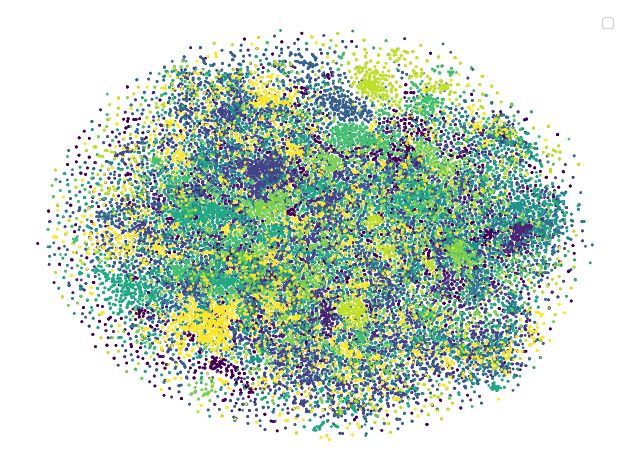

In [43]:
plt.scatter(
    X_embedded[:, 0], X_embedded[:, 1],
#     alpha=0.7, 
    s=1,
    c=mice_ids
)

plt.xticks([])  # Remove x ticks
plt.yticks([])  # Remove y ticks
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.tight_layout()
plt.legend()
plt.show()

### T-SNE without suspicious mice (20892 has higher visual areas and 20622 is V4 and not V2/3)

In [44]:
# all_together_subset = []
# mice_ids_subset = []

# for idx, a in enumerate(animals):
#     if ('20892' not in a) and ('20622' not in a): 
#         all_together_subset.append(per_animal_embeddings[a][0])
#         mice_ids_subset = mice_ids_subset + [a] * per_animal_embeddings[a][0].shape[0]

In [45]:
# animals

In [46]:
# mice_ids_subset[-3]

In [47]:
# all_together_subset_stacked = np.vstack(all_together_subset)
# print(all_together_subset_stacked.shape)
# X_embedded_subset = TSNE(n_components=2).fit_transform(all_together_subset_stacked)

In [48]:
X_embedded_subset = X_embedded

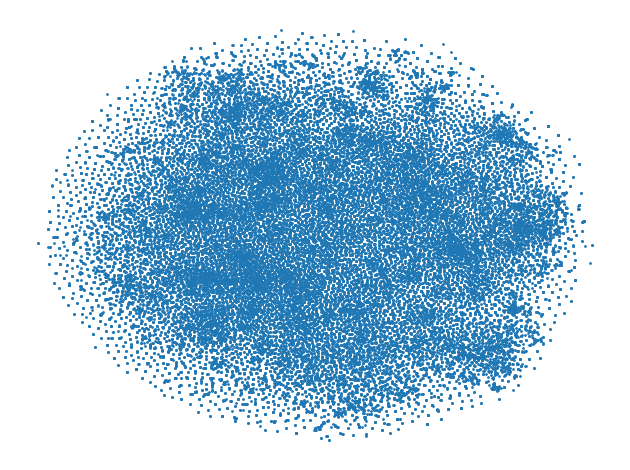

In [49]:
plt.scatter(
    X_embedded_subset[:, 0], X_embedded_subset[:, 1],
#     alpha=0.7, 
    s=1
)

plt.xticks([])  # Remove x ticks
plt.yticks([])  # Remove y ticks
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.tight_layout()
plt.show()

### subset colored by mice

In [52]:
mice_ids

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [ ]:
(np.asarray(mice_ids_subset) == mouse_id).any(), sum((np.asarray(mice_ids_subset) == mouse_id))

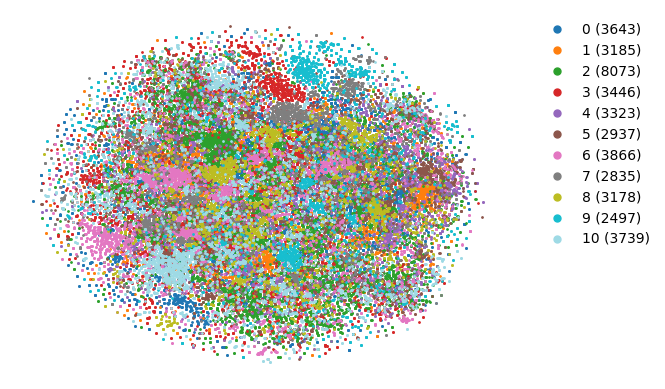

In [55]:
colors = plt.cm.tab20(np.linspace(0, 1, len(np.unique(mice_ids))))

for mouse_id, color in zip(np.unique(mice_ids), colors):
#     print(mouse_id)
    mask = np.asarray(mice_ids) == mouse_id
    plt.scatter(
        X_embedded_subset[mask, 0], X_embedded_subset[mask, 1],
        s=1,
        color=color,
        label=f'{mouse_id} ({per_animal_embeddings[animals[mouse_id]][0].shape[0]})'
    )

plt.xticks([])
plt.yticks([])
for spine in plt.gca().spines.values():
    spine.set_visible(False)

plt.legend(frameon=False, bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=5)
# plt.tight_layout()
# plt.show()

### Based on the plot above its seems like there is a bit of per-mouse bias so lets plots the mice separately

In [56]:
len(np.unique(mice_ids_subset))

NameError: name 'mice_ids_subset' is not defined

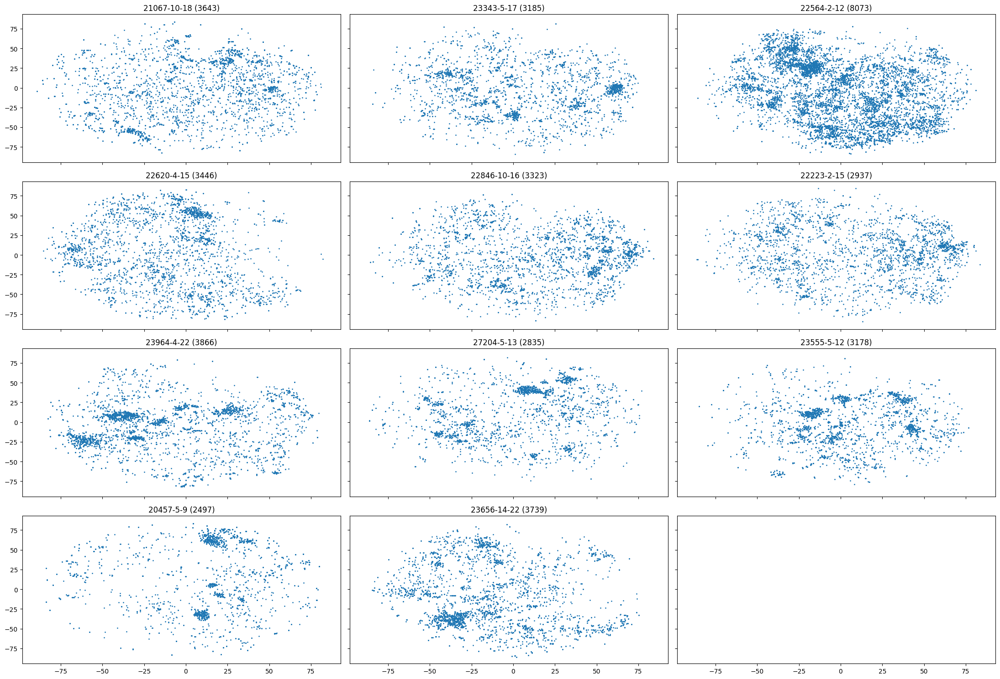

In [57]:
fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 15))
axes = axes.flatten()

for idx, a in enumerate(np.unique(mice_ids)):
#     (ari_kmeans, 'knn seeds'), (ari_model, 'model seeds')
    ax = axes[idx]
    mouse_id = a
    mask = np.asarray(mice_ids) == mouse_id
    ax.scatter(
        X_embedded_subset[mask, 0], X_embedded_subset[mask, 1],
        s=1,
#         color=color,
#         label=f'{mouse_id} ({per_animal_embeddings[mouse_id][0].shape[0]})'
    )
    ax.set_title(f'{animals[mouse_id]} ({per_animal_embeddings[animals[mouse_id]][0].shape[0]})')
    
plt.tight_layout()

### Now back to coloring again

### by depth - but we need to average depth for the embeddings we averaged as well ...

In [58]:
per_animal_embeddings_v2 = {}   # a -> list of 3 seed embeddings (deduped, whitened)
per_animal_positions = {} 

for a in tqdm(animals):
    responses_a = load_responses(a)
    unique_groups, individual_neurons = dedup_animal(coords[a], responses_a)
    
    # ---- ADDED: positions aligned to embedding rows ----
    ca = np.asarray(coords[a])
    grp_pos = (np.stack([ca[list(g)].mean(0) for g in unique_groups])
               if unique_groups else np.empty((0, 3)))
    per_animal_positions[a] = np.vstack([ca[individual_neurons], grp_pos])
    # ----------------------------------------------------
    
    seeds_emb = []
    for wh in whitened_per_animal[a]:
        grp = (np.stack([wh[list(g)].mean(0) for g in unique_groups])
               if unique_groups else np.empty((0, wh.shape[1])))
        seeds_emb.append(np.vstack([wh[individual_neurons], grp]))
    per_animal_embeddings_v2[a] = seeds_emb
    print(a, seeds_emb[0].shape)

  9%|███████████████▊                                                                                                                                                              | 1/11 [00:08<01:23,  8.30s/it]

21067-10-18 (3643, 96)


 18%|███████████████████████████████▋                                                                                                                                              | 2/11 [00:15<01:06,  7.38s/it]

23343-5-17 (3185, 96)


 27%|███████████████████████████████████████████████▍                                                                                                                              | 3/11 [00:19<00:48,  6.10s/it]

22564-2-12 (8073, 96)


 36%|███████████████████████████████████████████████████████████████▎                                                                                                              | 4/11 [00:27<00:47,  6.79s/it]

22620-4-15 (3446, 96)


 45%|███████████████████████████████████████████████████████████████████████████████                                                                                               | 5/11 [00:34<00:40,  6.78s/it]

22846-10-16 (3323, 96)


 55%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 6/11 [00:35<00:25,  5.00s/it]

22223-2-15 (2937, 96)


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 7/11 [00:43<00:23,  5.76s/it]

23964-4-22 (3866, 96)


 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 8/11 [00:51<00:19,  6.53s/it]

27204-5-13 (2835, 96)


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 9/11 [00:56<00:12,  6.24s/it]

23555-5-12 (3178, 96)


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 10/11 [01:01<00:05,  5.81s/it]

20457-5-9 (2497, 96)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [01:09<00:00,  6.28s/it]

23656-14-22 (3739, 96)


In [59]:
for a in tqdm(animals):
    for i in range(len(per_animal_embeddings_v2[a])):
        assert (per_animal_embeddings_v2[a][i] == per_animal_embeddings[a][i]).all(), 'sth is off'

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 560.88it/s]


In [60]:
(per_animal_embeddings_v2[a][0] == per_animal_embeddings[a][0]).all()

True

In [61]:
per_animal_positions[a].shape, per_animal_embeddings[a][0].shape

((3739, 3), (3739, 96))

In [62]:
# np.unique(mice_ids_subset)

In [63]:
# np.unique(mice_ids_subset)

In [64]:
for a, v in per_animal_positions.items():
    print(a, len(np.unique(v[:, -1])))

21067-10-18 19
23343-5-17 19
22564-2-12 16
22620-4-15 20
22846-10-16 20
22223-2-15 15
23964-4-22 19
27204-5-13 19
23555-5-12 19
20457-5-9 19
23656-14-22 19


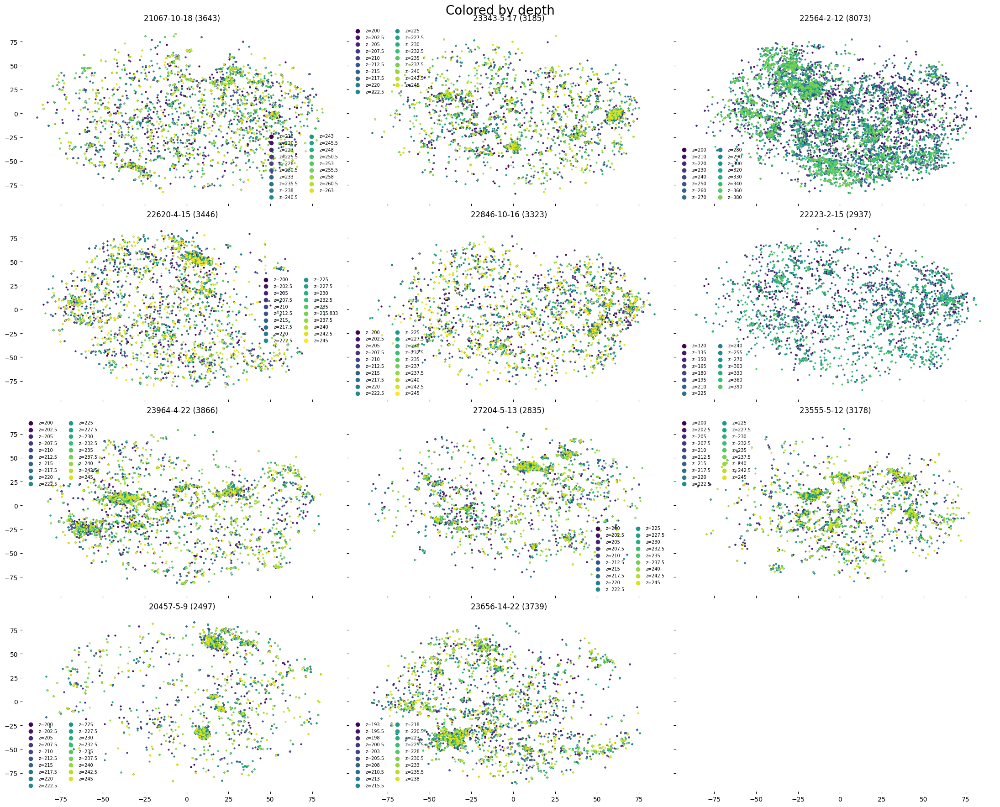

In [70]:
# palette = sns.color_palette("colorblind")   # 10 colors
# palette = plt.cm.tab20(np.linspace(0, 1, 20))
palette = plt.cm.viridis(np.linspace(0, 1, 20))


fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 18))
axes = axes.flatten()
for idx, a in enumerate(np.unique(mice_ids)):
    ax = axes[idx]
    mouse_id = a
    mask = np.asarray(mice_ids) == mouse_id

    # ---- CHANGED: per-subplot depth colors + legend ----
    z = per_animal_positions[animals[a]][:, 2]
    z_sorted = sorted(np.unique(z))
    rank = {zz: i for i, zz in enumerate(z_sorted)}
    for zz in z_sorted:                       # one scatter per depth -> legend entry
        m = z == zz
        ax.scatter(
            X_embedded_subset[mask][m, 0], X_embedded_subset[mask][m, 1],
            s=4, color=palette[rank[zz] % len(palette)], label=f'z={zz:g}',
        )
    ax.legend(markerscale=3, fontsize=7, frameon=False, ncol=2)
    # -----------------------------------------------------

    ax.set_title(f'{animals[mouse_id]} ({per_animal_embeddings[animals[mouse_id]][0].shape[0]})')
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
ax = axes[-1]    
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
plt.suptitle('Colored by depth', fontsize=20)
plt.tight_layout()

### by x

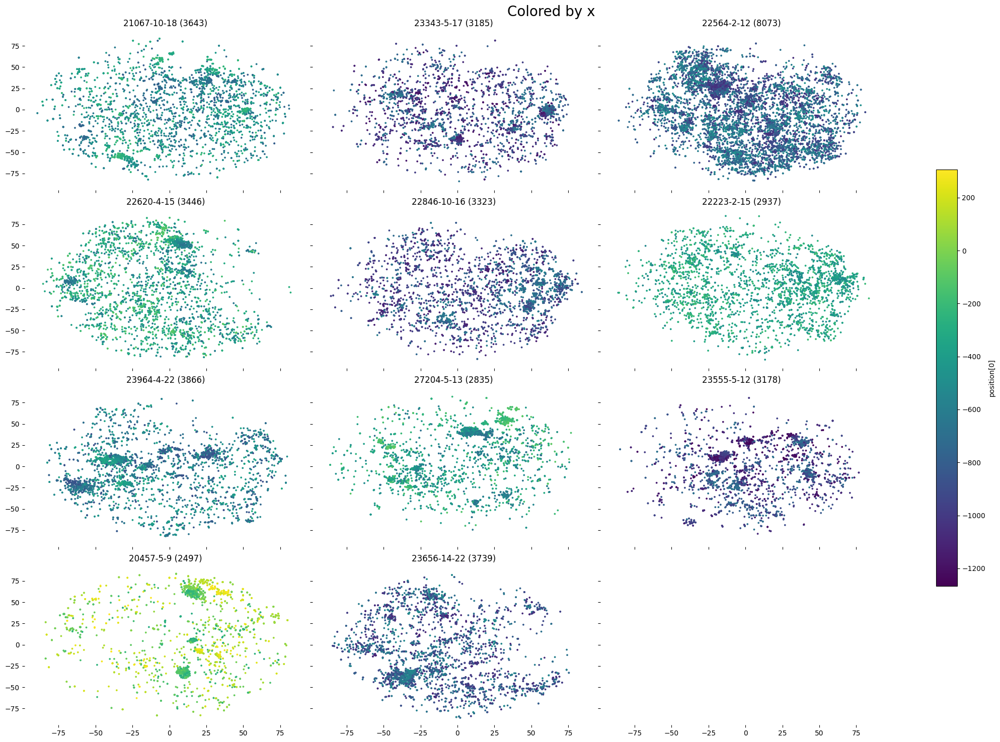

In [76]:
AXIS = 0   # 0 -> x, 1 -> y

# ---- shared normalization across all subplots ----
all_vals = np.concatenate([per_animal_positions[animals[a]][:, AXIS]
                           for a in np.unique(mice_ids)])
norm = plt.Normalize(all_vals.min(), all_vals.max())
cmap = "viridis"

fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 15))
axes = axes.flatten()
sc = None
for idx, a in enumerate(np.unique(mice_ids)):
    ax = axes[idx]
    mask = np.asarray(mice_ids) == a
    sc = ax.scatter(
        X_embedded_subset[mask, 0], X_embedded_subset[mask, 1],
        s=3,
        c=per_animal_positions[animals[a]][:, AXIS],   # <-- continuous -> use c=
        cmap=cmap, norm=norm,                 # <-- shared scale
    )
    ax.set_title(f'{animals[a]} ({per_animal_embeddings[animals[a]][0].shape[0]})')
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

    ax = axes[-1]    
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
plt.suptitle('Colored by x', fontsize=20)
plt.tight_layout()
fig.colorbar(sc, ax=axes, shrink=0.6, label=f'position[{AXIS}]')   # shared colorbar

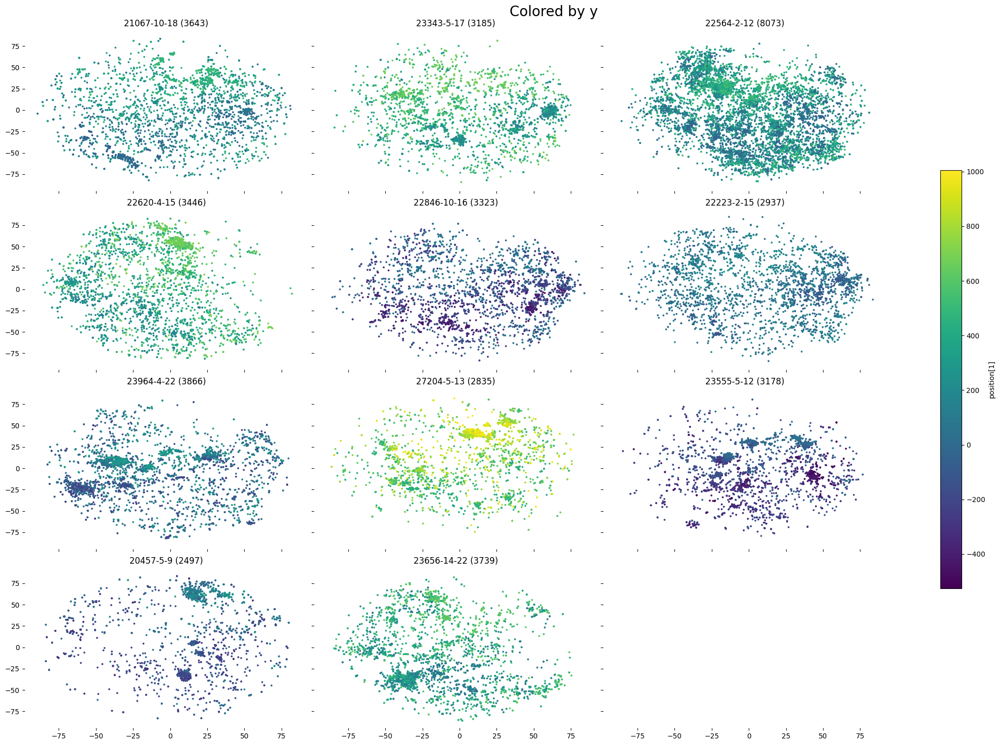

In [82]:
AXIS = 1   # 0 -> x, 1 -> y

# ---- shared normalization across all subplots ----
all_vals = np.concatenate([per_animal_positions[animals[a]][:, AXIS]
                           for a in np.unique(mice_ids)])
norm = plt.Normalize(all_vals.min(), all_vals.max())
cmap = "viridis"

fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 15))
axes = axes.flatten()
sc = None
for idx, a in enumerate(np.unique(mice_ids)):
    ax = axes[idx]
    mask = np.asarray(mice_ids) == a
    sc = ax.scatter(
        X_embedded_subset[mask, 0], X_embedded_subset[mask, 1],
        s=3,
        c=per_animal_positions[animals[a]][:, AXIS],   # <-- continuous -> use c=
        cmap=cmap, norm=norm,                 # <-- shared scale
    )
    ax.set_title(f'{animals[a]} ({per_animal_embeddings[animals[a]][0].shape[0]})')
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

ax = axes[-1]    
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
plt.suptitle('Colored by y', fontsize=20)
plt.tight_layout()
fig.colorbar(sc, ax=axes, shrink=0.6, label=f'position[{AXIS}]')   # shared colorbar

### individual colorbars per subplot

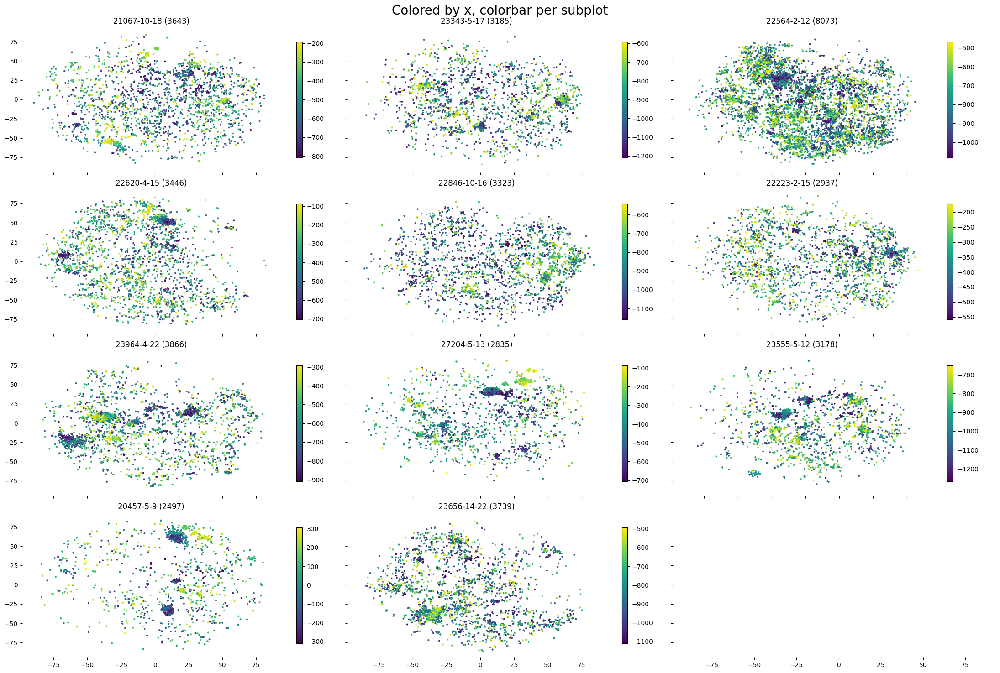

In [84]:
AXIS = 0   # 0 -> x, 1 -> y
cmap = "viridis"

fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 15))
axes = axes.flatten()
for idx, a in enumerate(np.unique(mice_ids)):
    ax = axes[idx]
    mask = np.asarray(mice_ids) == a
    sc = ax.scatter(
        X_embedded_subset[mask, 0], X_embedded_subset[mask, 1],
        s=3,
        c=per_animal_positions[animals[a]][:, AXIS],   # continuous
        cmap=cmap,                            # <-- CHANGED: no shared norm -> per-subplot range
    )
    ax.set_title(f'{animals[a]} ({per_animal_embeddings[animals[a]][0].shape[0]})')
    fig.colorbar(sc, ax=ax, shrink=0.8)       # <-- CHANGED: colorbar per subplot
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    
ax = axes[-1]    
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
    
plt.suptitle('Colored by x, colorbar per subplot', fontsize=20)
plt.tight_layout()

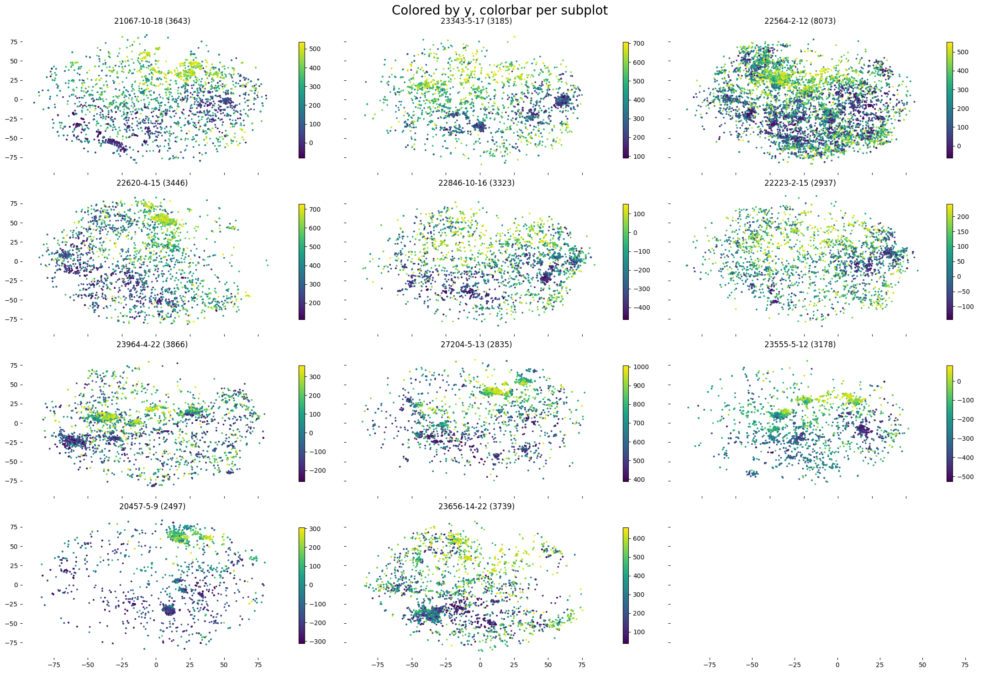

In [85]:
AXIS = 1   # 0 -> x, 1 -> y
cmap = "viridis"

fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 15))
axes = axes.flatten()
for idx, a in enumerate(np.unique(mice_ids)):
    ax = axes[idx]
    mask = np.asarray(mice_ids) == a
    sc = ax.scatter(
        X_embedded_subset[mask, 0], X_embedded_subset[mask, 1],
        s=3,
        c=per_animal_positions[animals[a]][:, AXIS],   # continuous
        cmap=cmap,                            # <-- CHANGED: no shared norm -> per-subplot range
    )
    ax.set_title(f'{animals[a]} ({per_animal_embeddings[animals[a]][0].shape[0]})')
    fig.colorbar(sc, ax=ax, shrink=0.8)       # <-- CHANGED: colorbar per subplot
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
ax = axes[-1]    
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)    
plt.suptitle('Colored by y, colorbar per subplot', fontsize=20)
plt.tight_layout()

### Plot x-y-z jointly

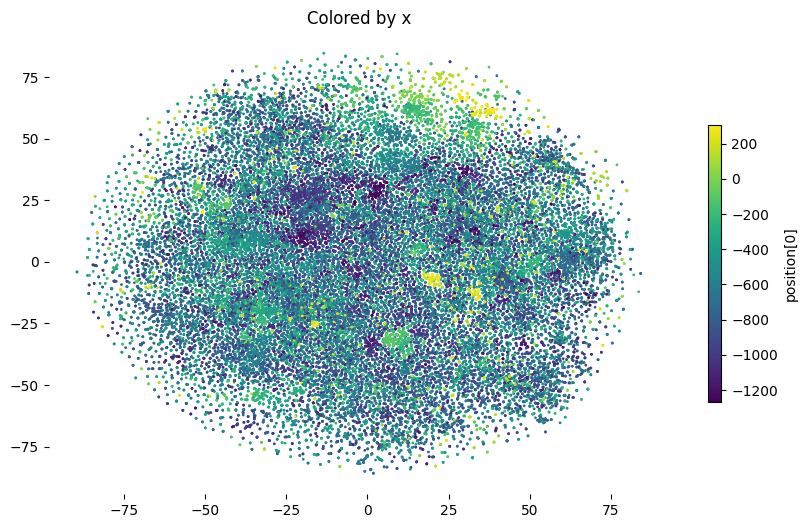

In [89]:
AXIS = 0   # 0 -> x, 1 -> y

plt.figure(figsize=(10, 6))

# ---- shared normalization across all subplots ----
all_vals = np.concatenate([per_animal_positions[animals[a]][:, AXIS]
                           for a in np.unique(mice_ids)])
norm = plt.Normalize(all_vals.min(), all_vals.max())
cmap = "viridis"

# fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 15))
# axes = axes.flatten()
sc = None
for idx, a in enumerate(np.unique(mice_ids)):
#     ax = axes[idx]
    mask = np.asarray(mice_ids) == a
    plt.scatter(
        X_embedded_subset[mask, 0], X_embedded_subset[mask, 1],
        s=1,
        c=per_animal_positions[animals[a]][:, AXIS],   # <-- continuous -> use c=
        cmap=cmap, norm=norm,                 # <-- shared scale
    )
#     ax.set_title(f'{a} ({per_animal_embeddings[a][0].shape[0]})')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(False)
    
plt.title('Colored by x')
# plt.tight_layout()
plt.colorbar(shrink=0.6, label=f'position[{AXIS}]')   # shared colorbar

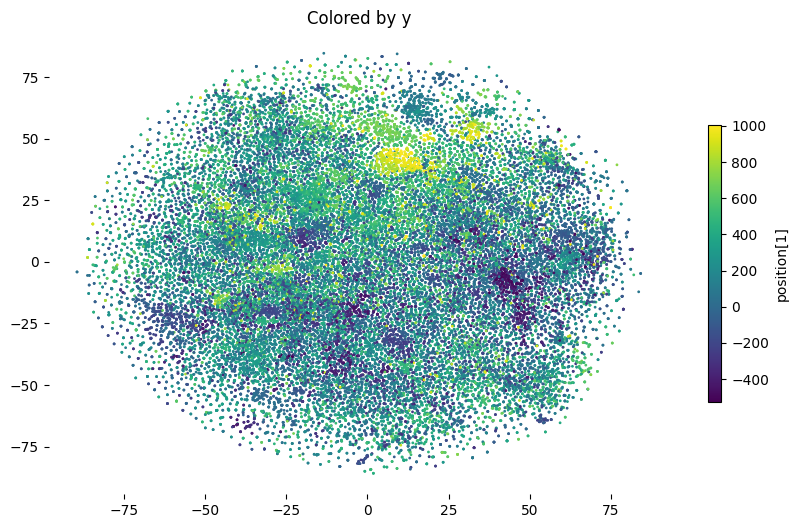

In [92]:
AXIS = 1   # 0 -> x, 1 -> y

plt.figure(figsize=(10, 6))

# ---- shared normalization across all subplots ----
all_vals = np.concatenate([per_animal_positions[animals[a]][:, AXIS]
                           for a in np.unique(mice_ids)])
norm = plt.Normalize(all_vals.min(), all_vals.max())
cmap = "viridis"

# fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 15))
# axes = axes.flatten()
sc = None
for idx, a in enumerate(np.unique(mice_ids)):
#     ax = axes[idx]
    mask = np.asarray(mice_ids) == a
    plt.scatter(
        X_embedded_subset[mask, 0], X_embedded_subset[mask, 1],
        s=1,
        c=per_animal_positions[animals[a]][:, AXIS],   # <-- continuous -> use c=
        cmap=cmap, norm=norm,                 # <-- shared scale
    )
#     ax.set_title(f'{a} ({per_animal_embeddings[a][0].shape[0]})')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(False)
    
plt.title('Colored by y')
# plt.tight_layout()
plt.colorbar(shrink=0.6, label=f'position[{AXIS}]')   # shared colorbar

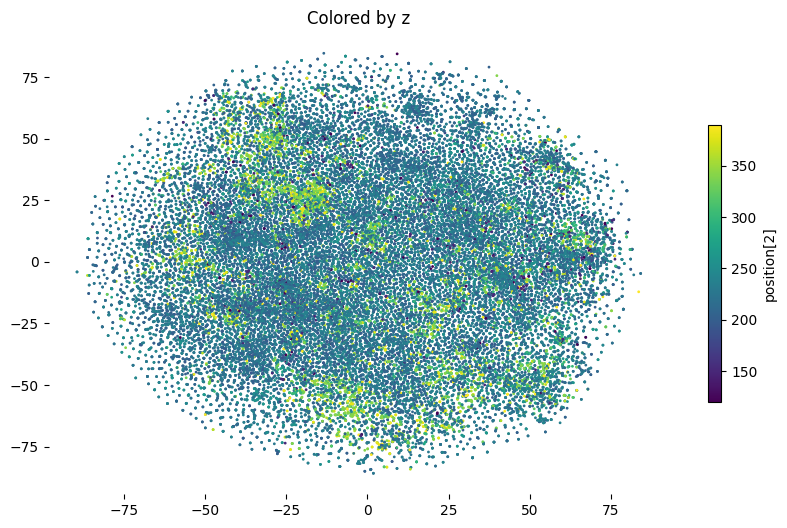

In [93]:
AXIS = 2   # 0 -> x, 1 -> y

plt.figure(figsize=(10, 6))

# ---- shared normalization across all subplots ----
all_vals = np.concatenate([per_animal_positions[animals[a]][:, AXIS]
                           for a in np.unique(mice_ids)])
norm = plt.Normalize(all_vals.min(), all_vals.max())
cmap = "viridis"

# fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(22, 15))
# axes = axes.flatten()
sc = None
for idx, a in enumerate(np.unique(mice_ids)):
#     ax = axes[idx]
    mask = np.asarray(mice_ids) == a
    plt.scatter(
        X_embedded_subset[mask, 0], X_embedded_subset[mask, 1],
        s=1,
        c=per_animal_positions[animals[a]][:, AXIS],   # <-- continuous -> use c=
        cmap=cmap, norm=norm,                 # <-- shared scale
    )
#     ax.set_title(f'{a} ({per_animal_embeddings[a][0].shape[0]})')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(False)
    
plt.title('Colored by z')
# plt.tight_layout()
plt.colorbar(shrink=0.6, label=f'position[{AXIS}]')   # shared colorbar

### Bootstrapping - to be continued with the correct models (11 mice models)

In [201]:
animals

['23555-5-12',
 '20622-2-14',
 '23964-4-22',
 '23343-5-17',
 '22223-2-15',
 '23656-14-22',
 '26872-17-20',
 '22846-10-16',
 '20457-5-9',
 '27204-5-13',
 '22620-4-15',
 '21067-10-18',
 '22564-2-12',
 '20892-10-10']

In [277]:
# ari_model_v4, ari_kmeans_v4, gauss_kmeans_v4 = {}, {}, {}
# for _ in tqdm(range(3)):
#     an_idx = np.random.choice(list(range(len(animals))), 4, replace=False)
#     name = '\n'.join(list(np.array(animals)[an_idx]))
#     embs = [np.vstack([per_animal_embeddings[a][i] for a in list(np.array(animals)[an_idx])]) for i in range(3)]
#     ari_model_v4[name]  = ari_curve(embs, [42, 42, 42])          # 3 model seeds, fixed km seed
#     ari_kmeans_v4[name] = ari_curve([embs[0]]*3, [0, 42, 101])   # 1 embedding, 3 km seeds
    
#     X = embs[0]
#     mu, C = X.mean(0), np.cov(X.T)
#     L = np.linalg.cholesky(C + 1e-6*np.eye(X.shape[1]))
#     G  = mu + np.random.default_rng(0).standard_normal(X.shape)   @ L.T
#     gauss_kmeans_v4[name] = ari_curve([G]*3, [0, 42, 101])

### Mara's analysis

### Ok - what could be this peak around 6??? - wait for 11 mice model!